In [ ]:
# %%

import time
import torch
from datasets import load_dataset
from transformers import AutoTokenizer, AutoModelForCausalLM
import matplotlib.pyplot as plt
import numpy as np
from enum import Enum
from collections import defaultdict
import json
from sklearn.decomposition import PCA

# %% [markdown]

 ### TODO: setup
 - Capture the k, v ,q projections
 - determine a way to setup

In [ ]:
# %%

class DatasetTypes(Enum):
    WIKI = ("wikitext", "wikitext-2-raw-v1")
    INTERNET = ("allenai/c4", "en")
    CODE = "bigcode/starcoderdata"
    ASSISTANT = "HuggingFaceH4/ultrachat_200k"


def get_dataset(dataset_type: DatasetTypes):
    if dataset_type == DatasetTypes.WIKI or dataset_type == DatasetTypes.INTERNET:
        return load_dataset(
            dataset_type.value[0], dataset_type.value[1], streaming=True
        )
    return load_dataset(dataset_type.value, streaming=True)

In [ ]:
# %%

dataset = get_dataset(DatasetTypes.INTERNET)

In [ ]:
# %%

# Load tokenizer and model
num_samples = 2
max_clusters = 5
num_heads = 12
head_dim = 64
min_seq_len = 1024

model_name = "gpt2"
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForCausalLM.from_pretrained(model_name, output_attentions=True)

/opt/miniconda3/lib/python3.12/site-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


In [ ]:
# %%

all_intermediates = defaultdict(list)


def get_activation(name):
    def hook(module, input, output):
        all_intermediates[name].append(output.detach())

    return hook


# Register hooks for each attention layer
for name, module in model.named_modules():
    if "attn.c_attn" in name:
        module.register_forward_hook(get_activation(name))

In [ ]:
# %%

stream = iter(dataset["train"])

In [ ]:
# %%

for i in range(num_samples):
    input_text = next(stream)["text"]
    combined_text = input_text
    inputs = tokenizer(combined_text, return_tensors="pt")
    sequence_length = inputs.input_ids.shape[1]

    while sequence_length < min_seq_len:
        combined_text += " " + input_text
        inputs = tokenizer(combined_text, return_tensors="pt")
        sequence_length = inputs.input_ids.shape[1]

    # cap length of input to min sequence length tokens
    inputs_sliced = {
        "input_ids": inputs.input_ids[:, :min_seq_len],
        "attention_mask": inputs.attention_mask[:, :min_seq_len],
    }

    sequence_length = inputs_sliced["input_ids"].shape[1]

    # Run the model
    with torch.no_grad():
        outputs = model(**inputs_sliced)

Token indices sequence length is longer than the specified maximum sequence length for this model (1141 > 1024). Running this sequence through the model will result in indexing errors


In [ ]:
# %%

from sklearn.cluster import KMeans, SpectralClustering, DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import (
    silhouette_score,
    davies_bouldin_score,
    calinski_harabasz_score,
)

In [ ]:
# %%

projs_per_layer = [[[]] * num_heads] * model.config.n_layer

In [ ]:
# %%

for i, (name, samples_out) in enumerate(all_intermediates.items()):
    for qkv in samples_out:
        qkv = qkv.squeeze(0)
        # The c_attn output contains q, k, v concatenated
        split_size = qkv.size(-1) // 3
        assert split_size == head_dim * num_heads
        q, k, v = torch.split(qkv, split_size, dim=-1)

        q = q.view(-1, num_heads, head_dim)
        for j in range(num_heads):
            q_head = q[:, j, :]
            projs_per_layer[i][j].append(q_head.numpy())

In [ ]:
# %%

def get_optimal_clusters(q_head):

    # Compute inertias and silhouette scores for different numbers of clusters
    inertias = []
    results = []
    start_time = time.time()
    for k in range(2, max_clusters + 1):

        print(f"clustering queries for layer {i} head {j} for cluster of size {k}")
        kmeans = KMeans(n_clusters=k, random_state=42)
        kmeans.fit(q_head_scaled)
        labels = kmeans.labels_
        inertias.append(kmeans.inertia_)

        ch_score = calinski_harabasz_score(q_head_scaled, labels)
        db_score = davies_bouldin_score(q_head_scaled, labels)
        results.append({"ch_score": ch_score, "db_score": db_score})

    end_time = time.time()
    computation_time = end_time - start_time

    print(f"Time taken to compute optimal clusters: {computation_time:.2f} seconds")

    optimal_k_ch = max(results, key=lambda x: x["ch_score"])["k"]
    optimal_k_db = min(results, key=lambda x: x["db_score"])["k"]
    # optimal_k_sil = max(results, key=lambda x: x['sil_score'])['k']

    return results, inertias, optimal_k_ch, optimal_k_db


def plot_inertia(inertias):
    # Plot elbow curve
    plt.figure(figsize=(12, 5))
    plt.subplot(121)
    plt.plot(range(2, max_clusters + 1), inertias, marker="o")
    plt.xlabel("Number of clusters")
    plt.ylabel("Inertia")
    plt.title("Elbow Method")


def plot_scores(results, score_type):
    scores = [result[score_type] for result in results]

    # Plot silhouette scores
    plt.subplot(122)
    plt.plot(
        range(2, 2 + len(scores)),
        scores,
        marker="o",
        label="K-means",
    )
    plt.xlabel("Number of clusters")
    plt.ylabel("Silhouette Score")
    plt.title("Silhouette Scores")
    plt.legend()
    plt.show()

    plt.tight_layout()
    plt.show()


def plot_optimal(q_head_scaled, queries_2d, optimal):
    kmeans = KMeans(n_clusters=optimal, random_state=42, n_init=10)
    kmeans_labels = kmeans.fit_predict(q_head_scaled)

    plt.figure(figsize=(10, 8))
    scatter = plt.scatter(
        queries_2d[:, 0], queries_2d[:, 1], c=kmeans_labels, cmap="viridis"
    )
    plt.colorbar(scatter)
    plt.title(f"Query Clusters for layer {i} head {j}\n(Optimal clusters: {optimal})")
    plt.xlabel("First Principal Component")
    plt.ylabel("Second Principal Component")
    plt.show()

In [ ]:
# %%

def get_optimal_clusters(q_head):

    # Compute inertias and silhouette scores for different numbers of clusters
    inertias = []
    results = []
    start_time = time.time()
    for k in range(2, max_clusters + 1):

        print(f"clustering queries for layer {i} head {j} for cluster of size {k}")
        kmeans = KMeans(n_clusters=k, random_state=42)
        kmeans.fit(q_head_scaled)
        labels = kmeans.labels_
        inertias.append(kmeans.inertia_)

        ch_score = calinski_harabasz_score(q_head_scaled, labels)
        db_score = davies_bouldin_score(q_head_scaled, labels)
        results.append({"ch_score": ch_score, "db_score": db_score, "k": k})

    end_time = time.time()
    computation_time = end_time - start_time

    print(f"Time taken to compute optimal clusters: {computation_time:.2f} seconds")

    optimal_k_ch = max(results, key=lambda x: x["ch_score"])["k"]
    optimal_k_db = min(results, key=lambda x: x["db_score"])["k"]
    # optimal_k_sil = max(results, key=lambda x: x['sil_score'])['k']

    return results, inertias, optimal_k_ch, optimal_k_db


def plot_inertia(inertias):
    # Plot elbow curve
    plt.figure(figsize=(12, 5))
    plt.subplot(121)
    plt.plot(range(2, max_clusters + 1), inertias, marker="o")
    plt.xlabel("Number of clusters")
    plt.ylabel("Inertia")
    plt.title("Elbow Method")


def plot_scores(results, score_type):
    scores = [result[score_type] for result in results]

    # Plot silhouette scores
    plt.subplot(122)
    plt.plot(
        range(2, 2 + len(scores)),
        scores,
        marker="o",
        label="K-means",
    )
    plt.xlabel("Number of clusters")
    plt.ylabel("Silhouette Score")
    plt.title("Silhouette Scores")
    plt.legend()
    plt.show()

    plt.tight_layout()
    plt.show()


def plot_optimal(q_head_scaled, queries_2d, optimal):
    kmeans = KMeans(n_clusters=optimal, random_state=42, n_init=10)
    kmeans_labels = kmeans.fit_predict(q_head_scaled)

    plt.figure(figsize=(10, 8))
    scatter = plt.scatter(
        queries_2d[:, 0], queries_2d[:, 1], c=kmeans_labels, cmap="viridis"
    )
    plt.colorbar(scatter)
    plt.title(f"Query Clusters for layer {i} head {j}\n(Optimal clusters: {optimal})")
    plt.xlabel("First Principal Component")
    plt.ylabel("Second Principal Component")
    plt.show()

clustering queries for layer 0 head 0 for cluster of size 2
clustering queries for layer 0 head 0 for cluster of size 3
clustering queries for layer 0 head 0 for cluster of size 4
clustering queries for layer 0 head 0 for cluster of size 5
Time taken to compute optimal clusters: 8.67 seconds


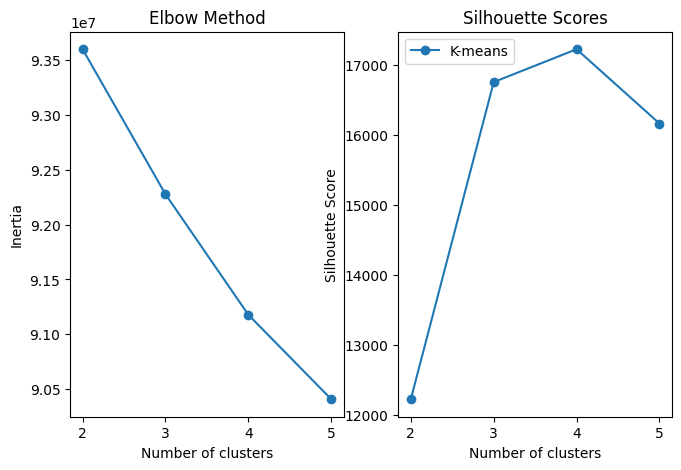

<Figure size 640x480 with 0 Axes>

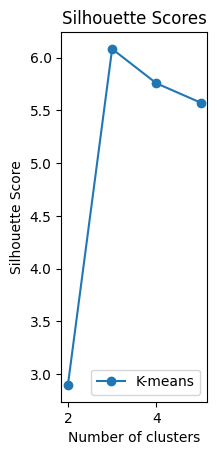

<Figure size 640x480 with 0 Axes>

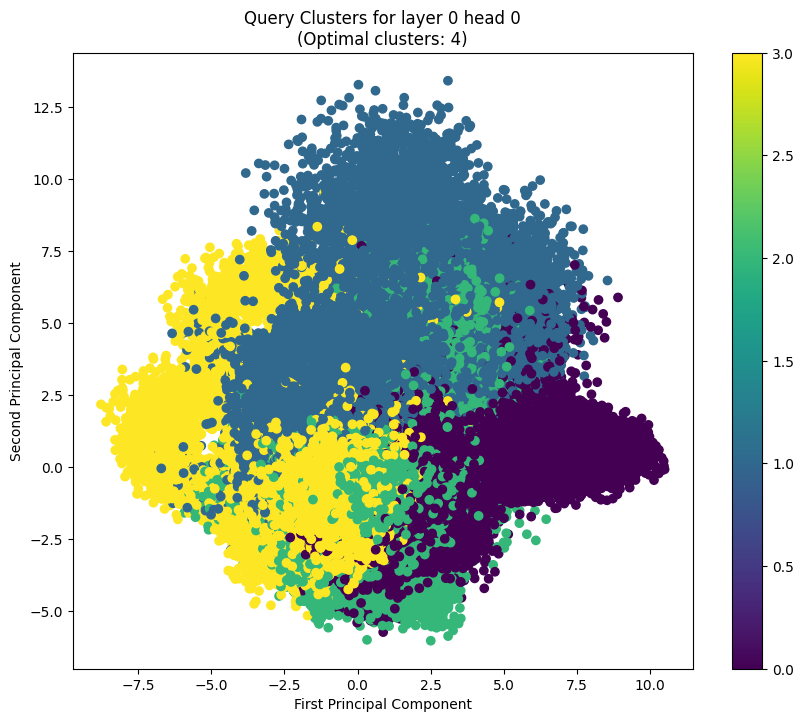

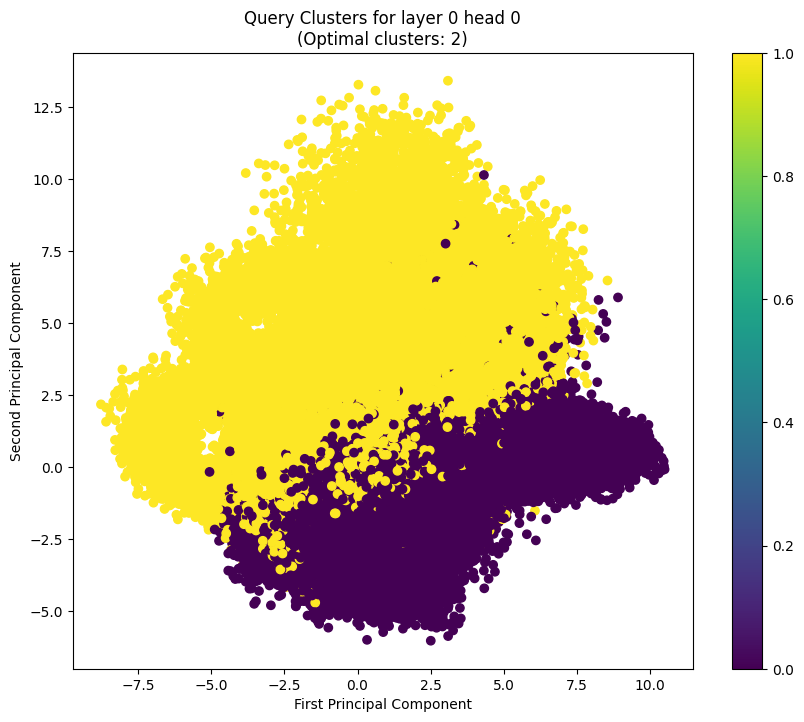

clustering queries for layer 0 head 1 for cluster of size 2
clustering queries for layer 0 head 1 for cluster of size 3
clustering queries for layer 0 head 1 for cluster of size 4
clustering queries for layer 0 head 1 for cluster of size 5
Time taken to compute optimal clusters: 8.69 seconds


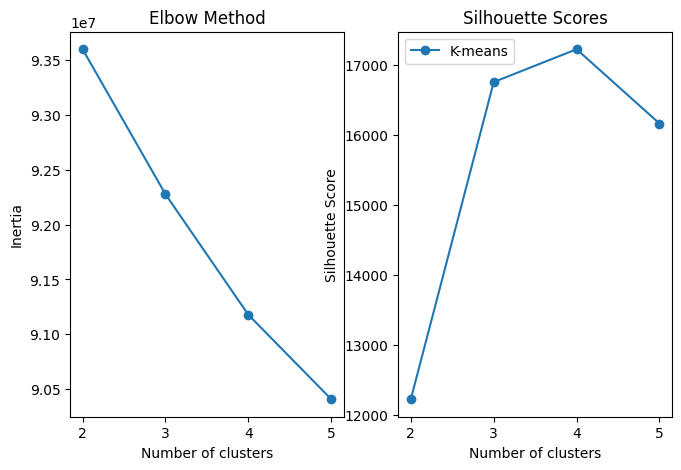

<Figure size 640x480 with 0 Axes>

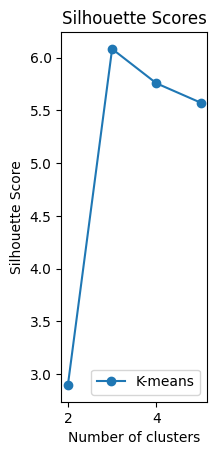

<Figure size 640x480 with 0 Axes>

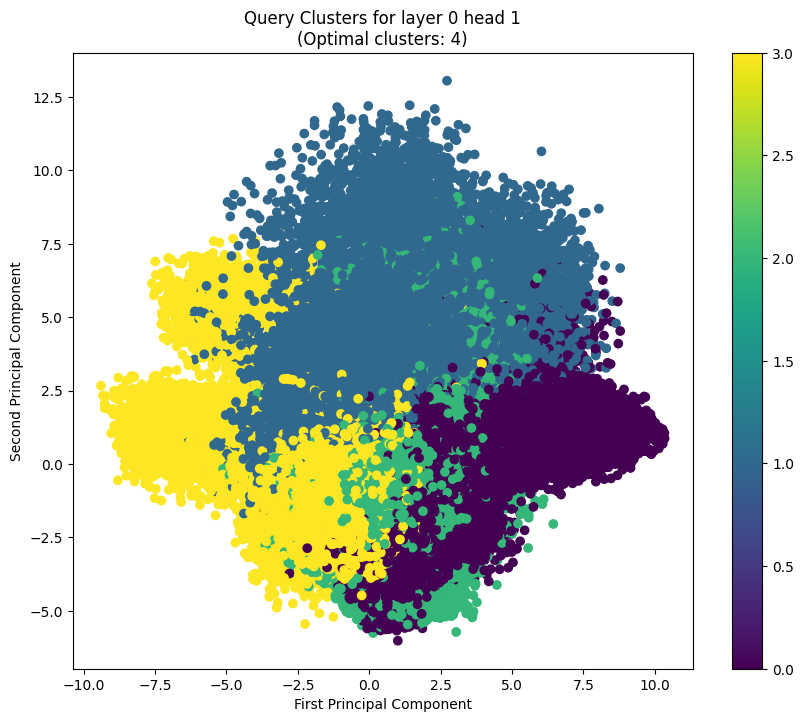

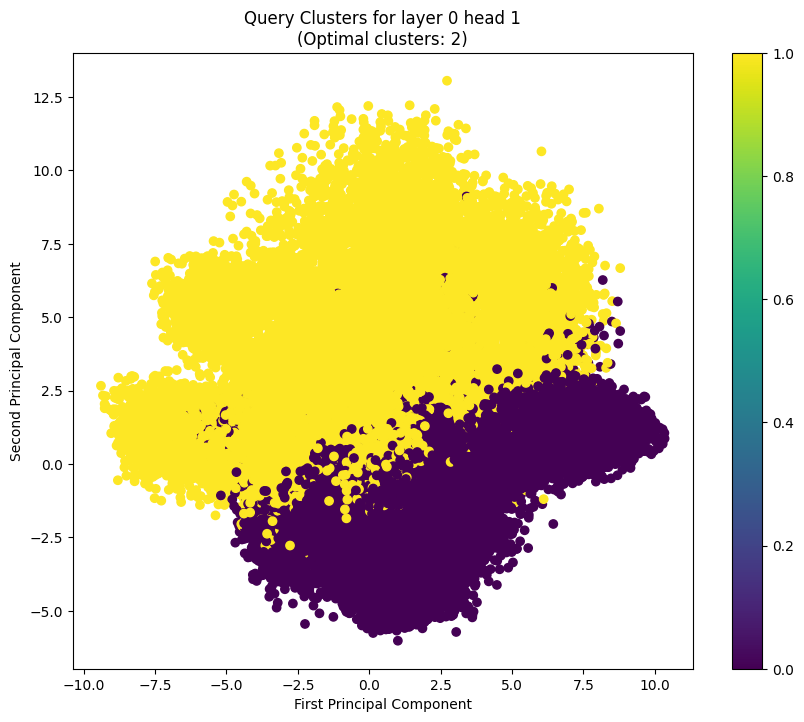

clustering queries for layer 0 head 2 for cluster of size 2
clustering queries for layer 0 head 2 for cluster of size 3
clustering queries for layer 0 head 2 for cluster of size 4
clustering queries for layer 0 head 2 for cluster of size 5
Time taken to compute optimal clusters: 8.71 seconds


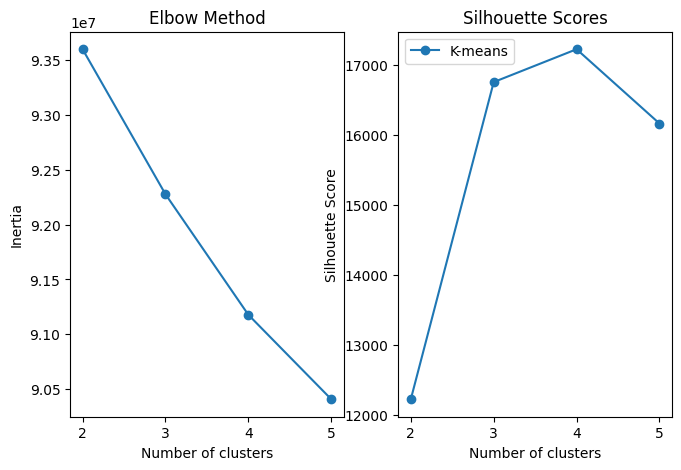

<Figure size 640x480 with 0 Axes>

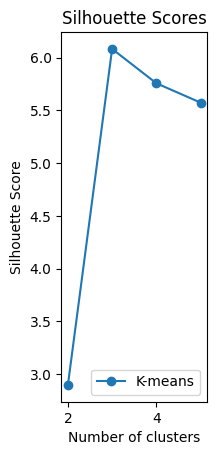

<Figure size 640x480 with 0 Axes>

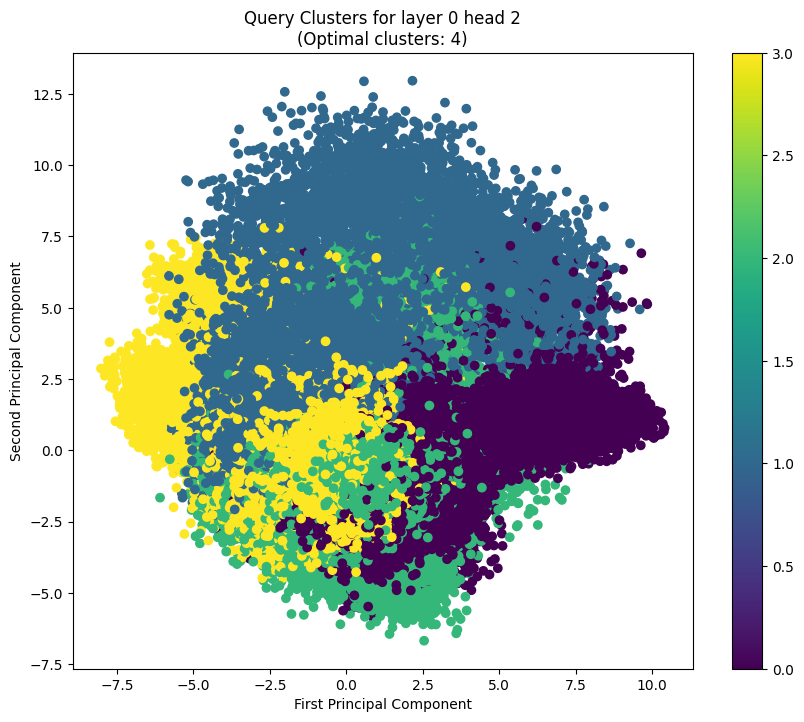

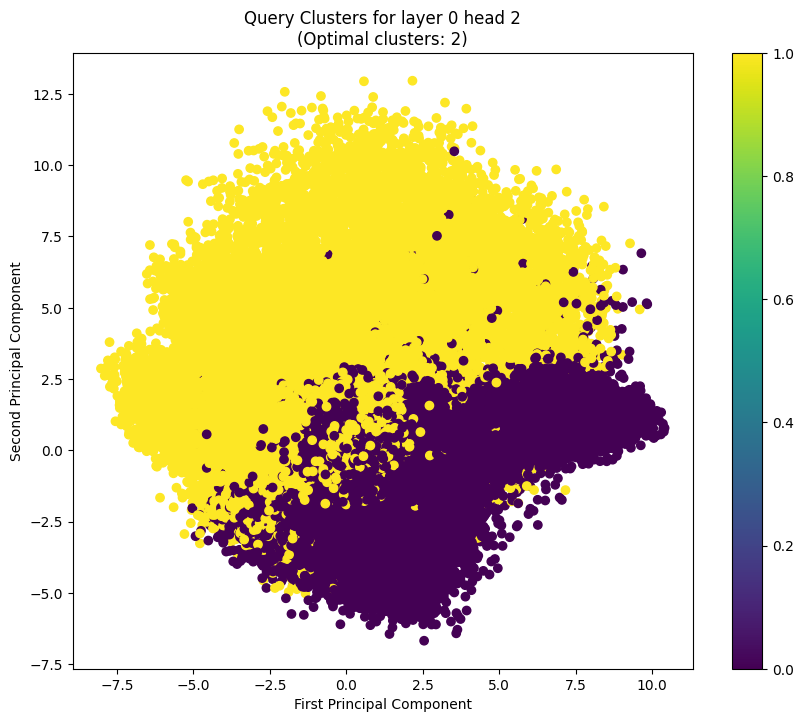

clustering queries for layer 0 head 3 for cluster of size 2
clustering queries for layer 0 head 3 for cluster of size 3
clustering queries for layer 0 head 3 for cluster of size 4
clustering queries for layer 0 head 3 for cluster of size 5
Time taken to compute optimal clusters: 8.69 seconds


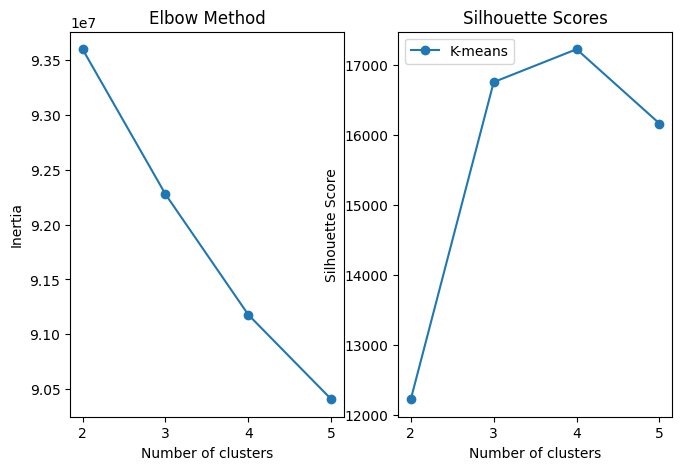

<Figure size 640x480 with 0 Axes>

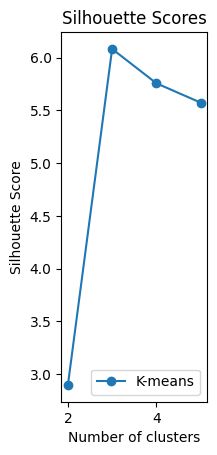

<Figure size 640x480 with 0 Axes>

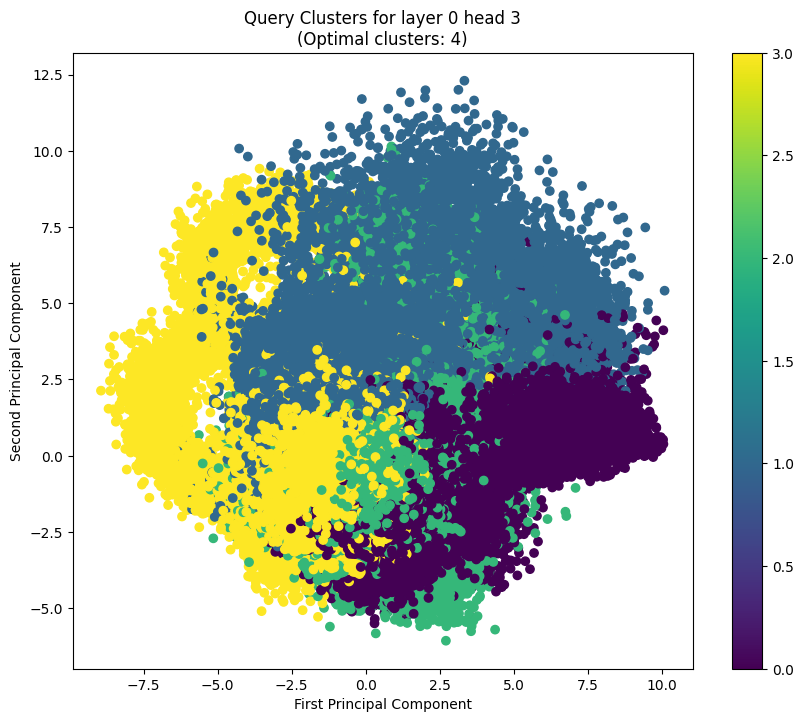

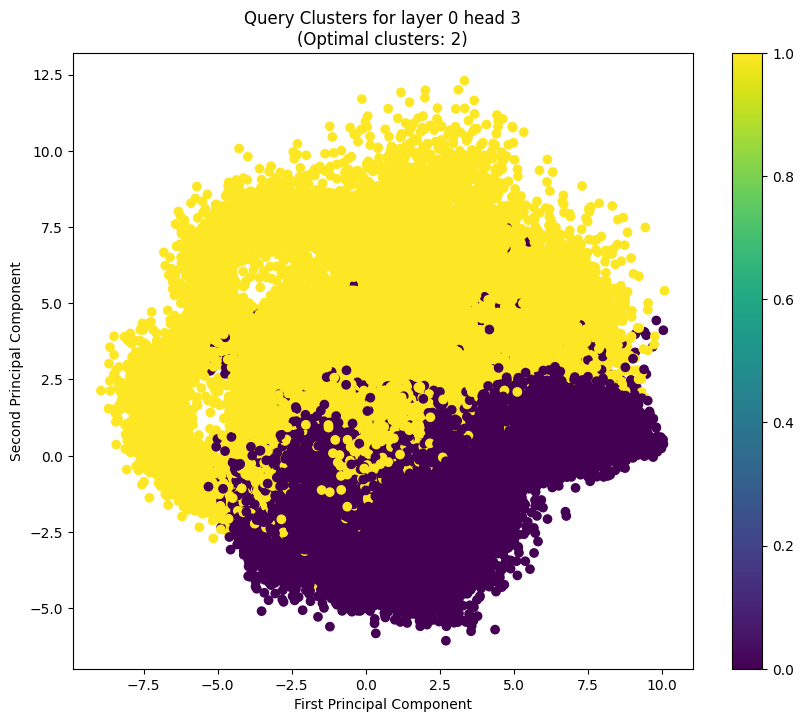

clustering queries for layer 0 head 4 for cluster of size 2
clustering queries for layer 0 head 4 for cluster of size 3
clustering queries for layer 0 head 4 for cluster of size 4
clustering queries for layer 0 head 4 for cluster of size 5
Time taken to compute optimal clusters: 8.51 seconds


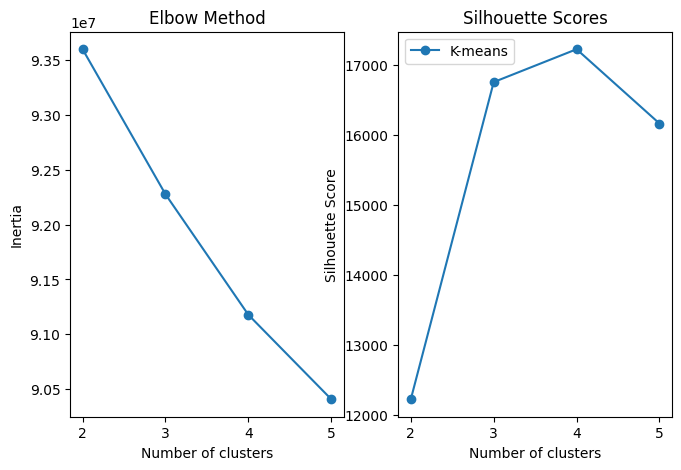

<Figure size 640x480 with 0 Axes>

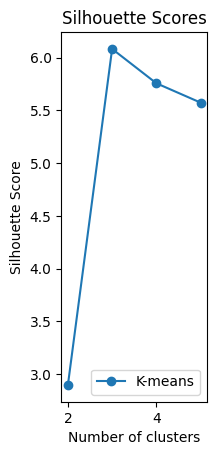

<Figure size 640x480 with 0 Axes>

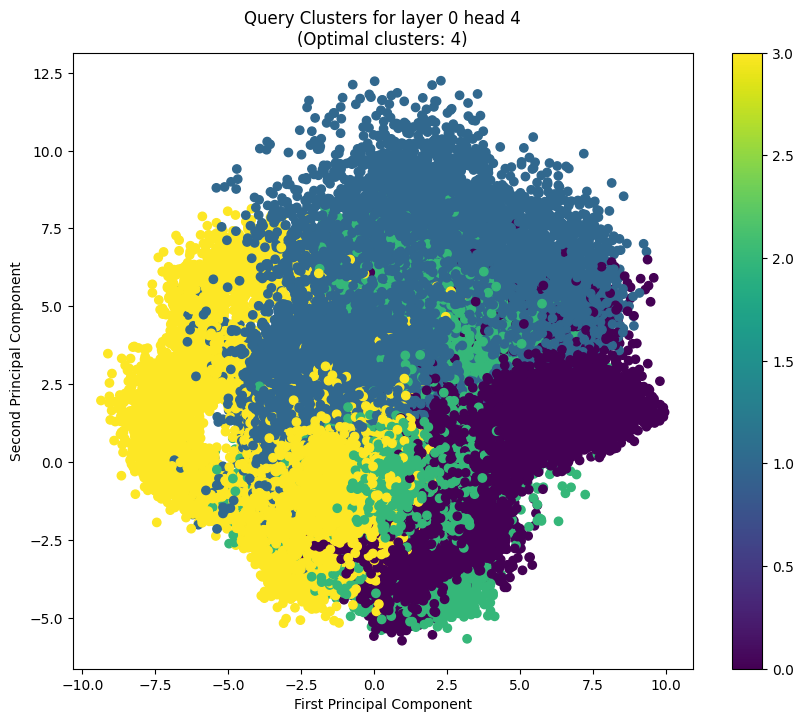

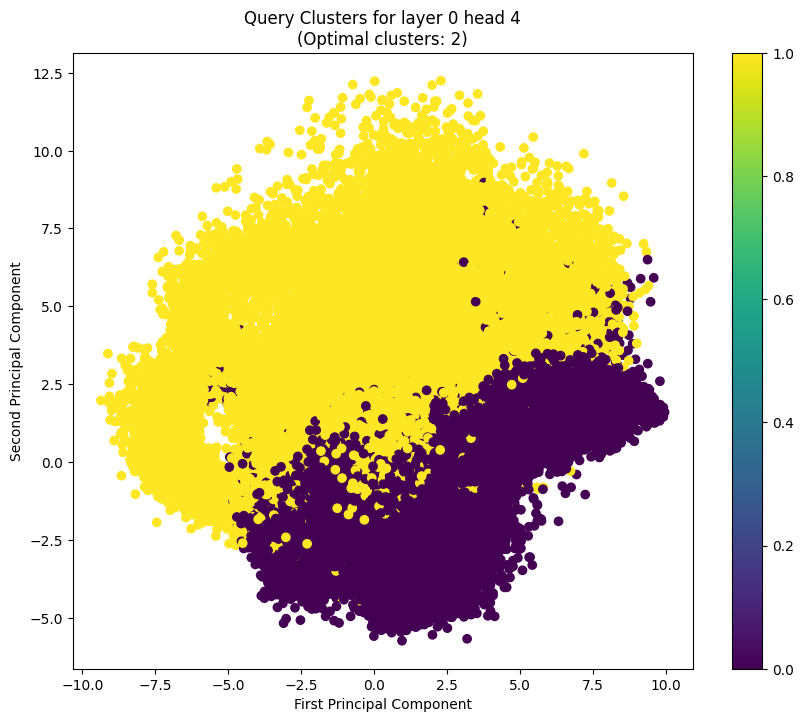

clustering queries for layer 0 head 5 for cluster of size 2
clustering queries for layer 0 head 5 for cluster of size 3
clustering queries for layer 0 head 5 for cluster of size 4
clustering queries for layer 0 head 5 for cluster of size 5
Time taken to compute optimal clusters: 8.55 seconds


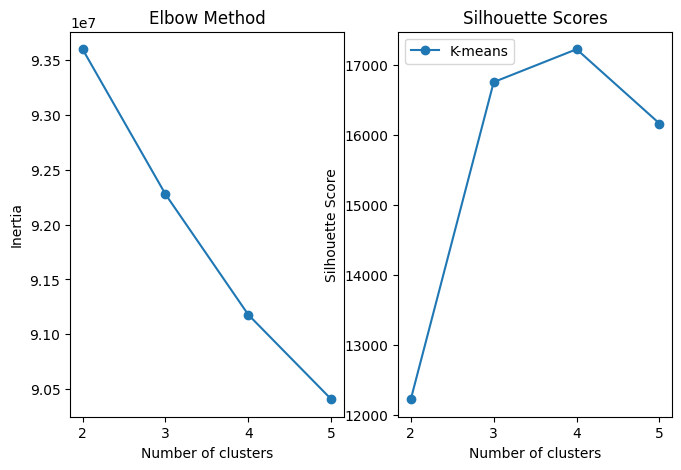

<Figure size 640x480 with 0 Axes>

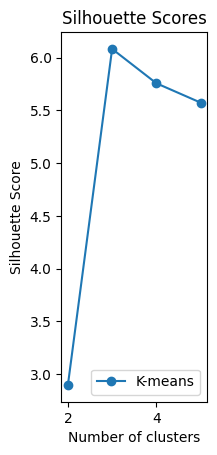

<Figure size 640x480 with 0 Axes>

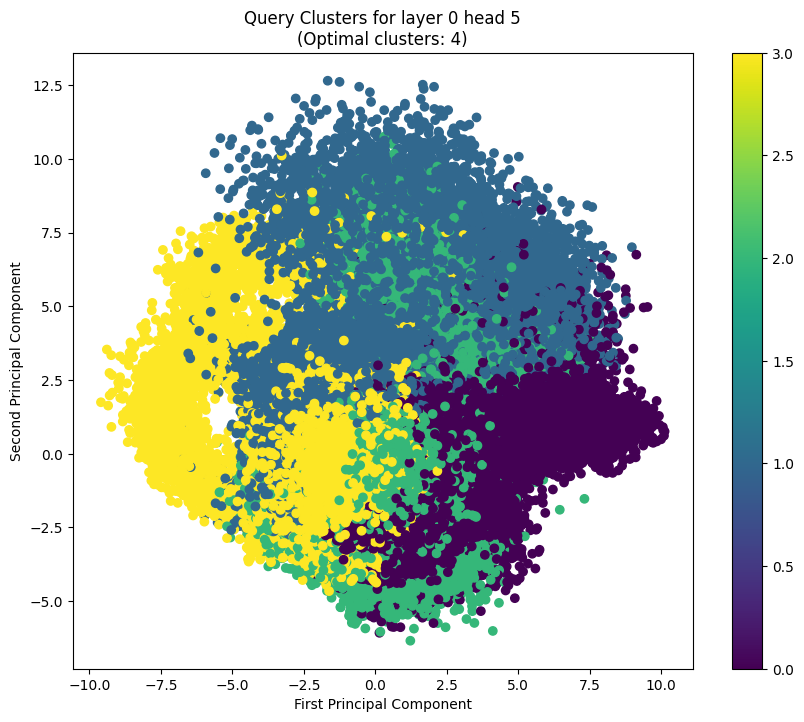

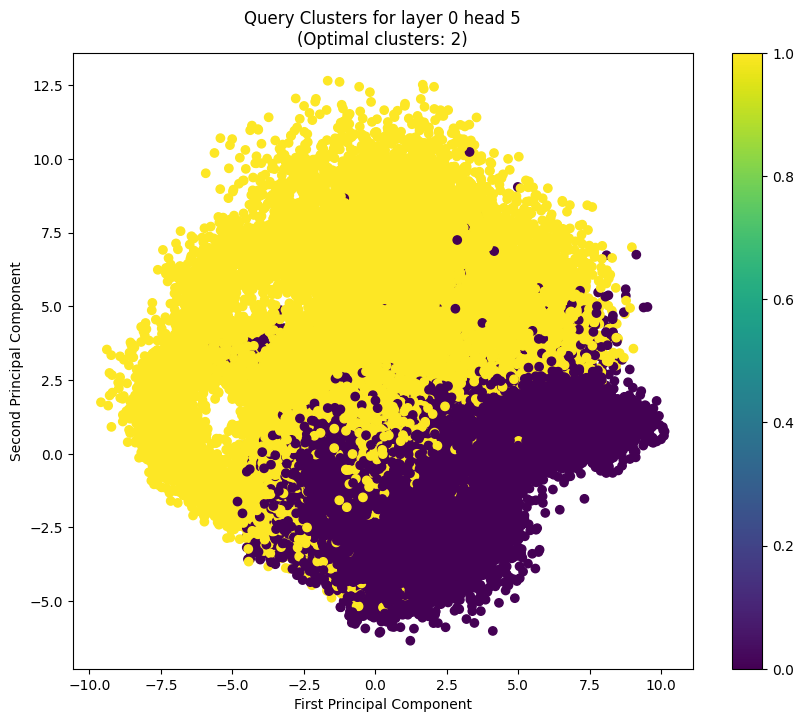

clustering queries for layer 0 head 6 for cluster of size 2
clustering queries for layer 0 head 6 for cluster of size 3
clustering queries for layer 0 head 6 for cluster of size 4
clustering queries for layer 0 head 6 for cluster of size 5
Time taken to compute optimal clusters: 9.48 seconds


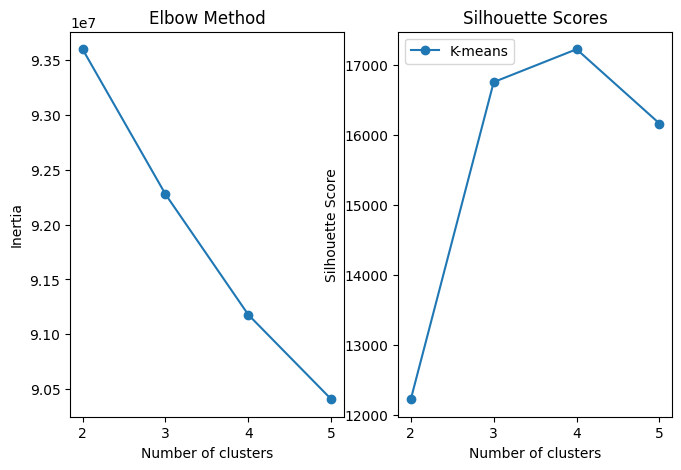

<Figure size 640x480 with 0 Axes>

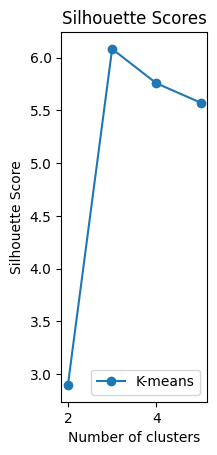

<Figure size 640x480 with 0 Axes>

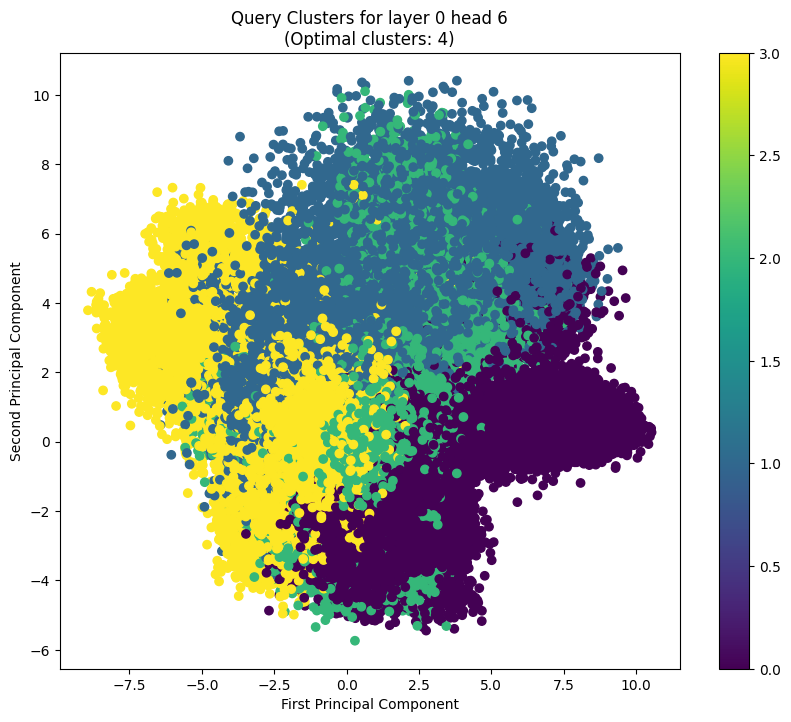

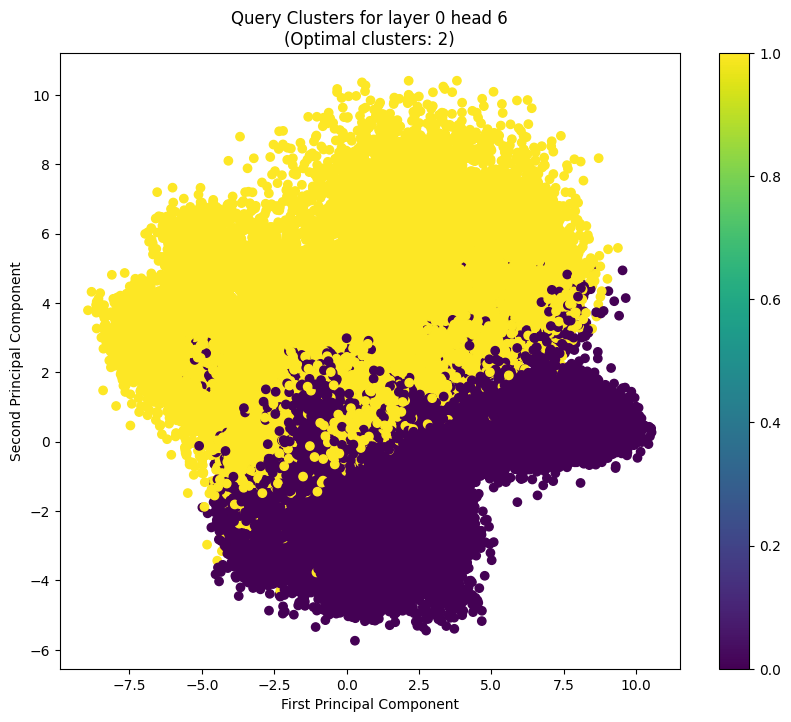

clustering queries for layer 0 head 7 for cluster of size 2
clustering queries for layer 0 head 7 for cluster of size 3
clustering queries for layer 0 head 7 for cluster of size 4
clustering queries for layer 0 head 7 for cluster of size 5
Time taken to compute optimal clusters: 8.60 seconds


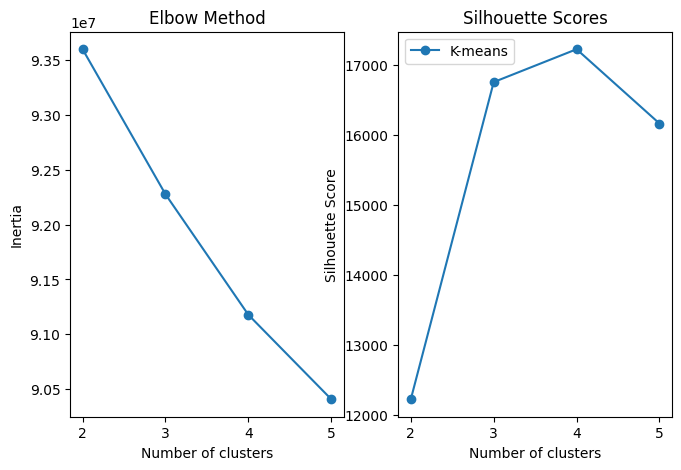

<Figure size 640x480 with 0 Axes>

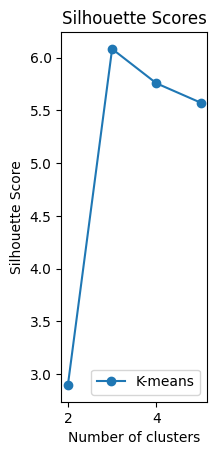

<Figure size 640x480 with 0 Axes>

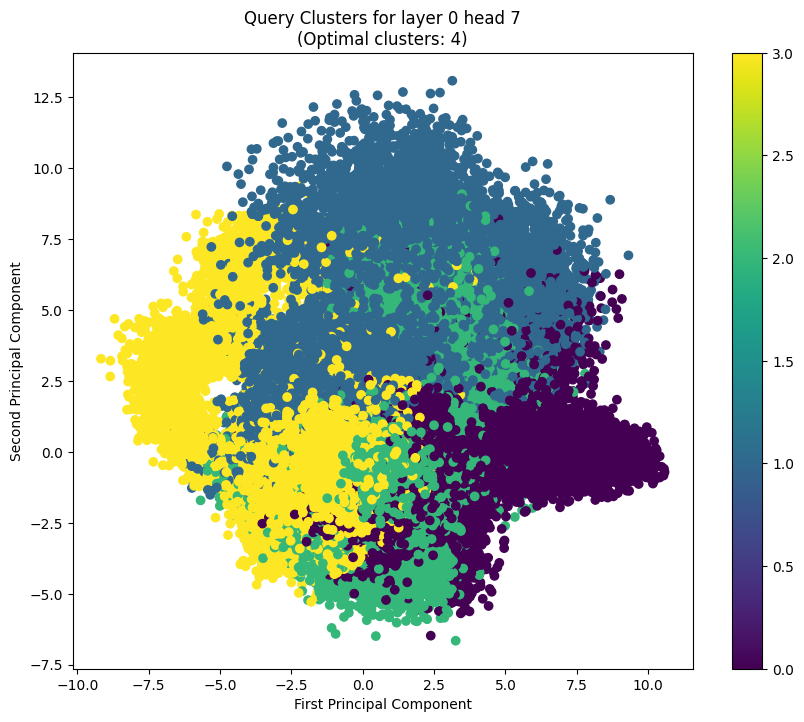

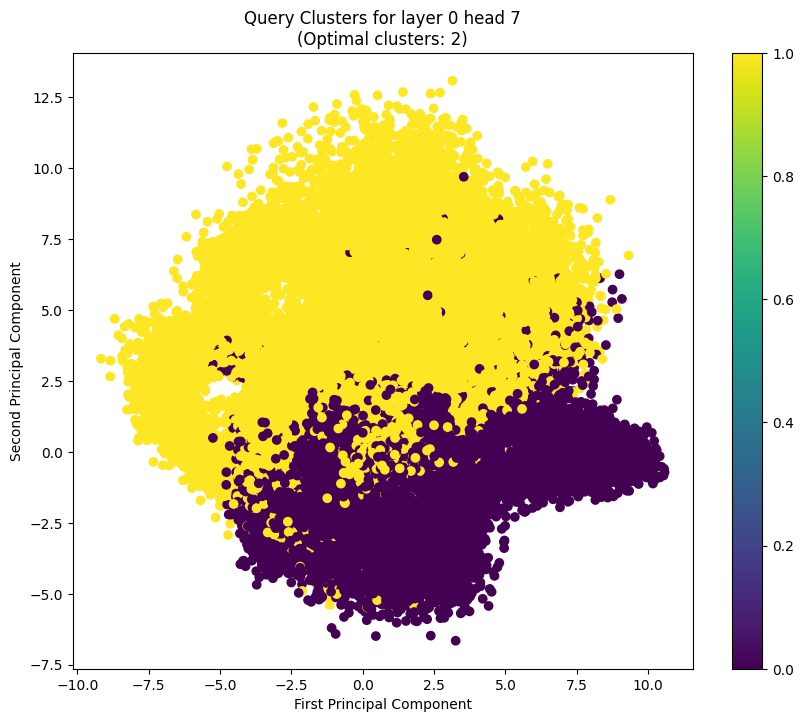

clustering queries for layer 0 head 8 for cluster of size 2
clustering queries for layer 0 head 8 for cluster of size 3
clustering queries for layer 0 head 8 for cluster of size 4
clustering queries for layer 0 head 8 for cluster of size 5
Time taken to compute optimal clusters: 8.71 seconds


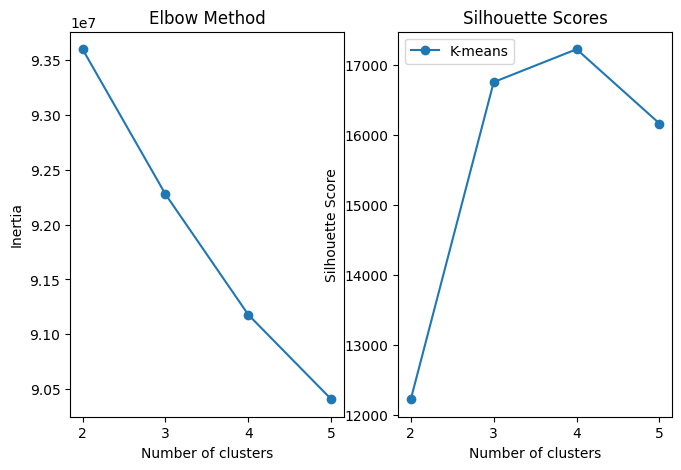

<Figure size 640x480 with 0 Axes>

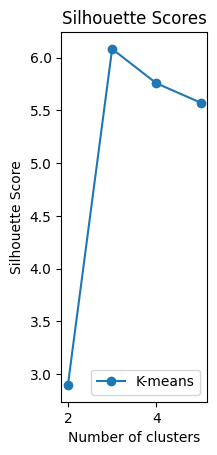

<Figure size 640x480 with 0 Axes>

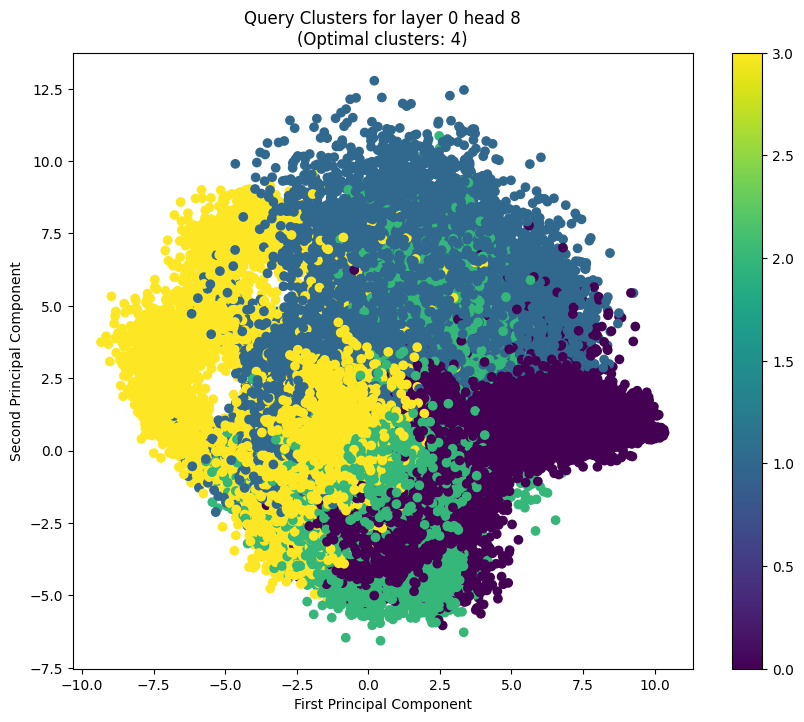

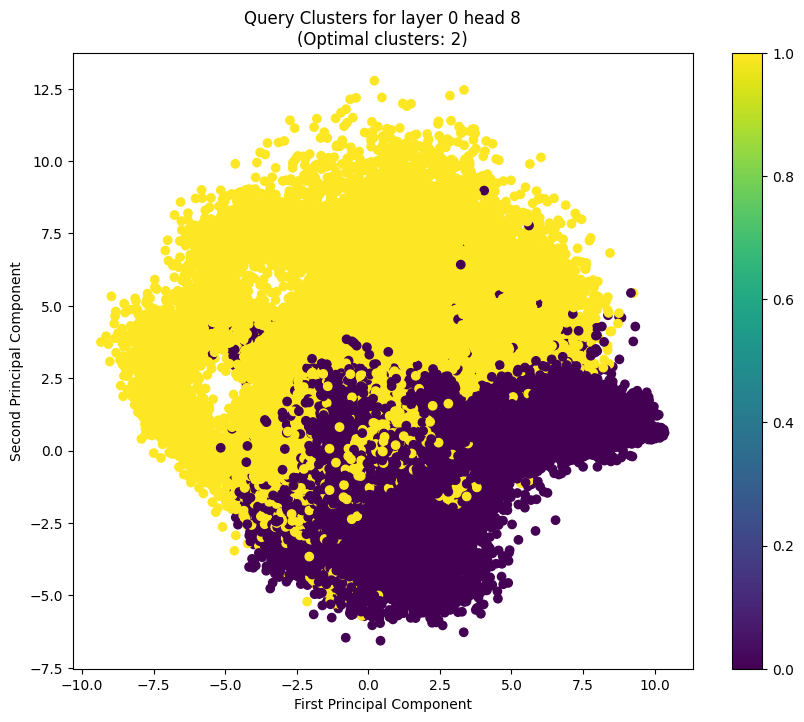

clustering queries for layer 0 head 9 for cluster of size 2
clustering queries for layer 0 head 9 for cluster of size 3
clustering queries for layer 0 head 9 for cluster of size 4
clustering queries for layer 0 head 9 for cluster of size 5
Time taken to compute optimal clusters: 8.52 seconds


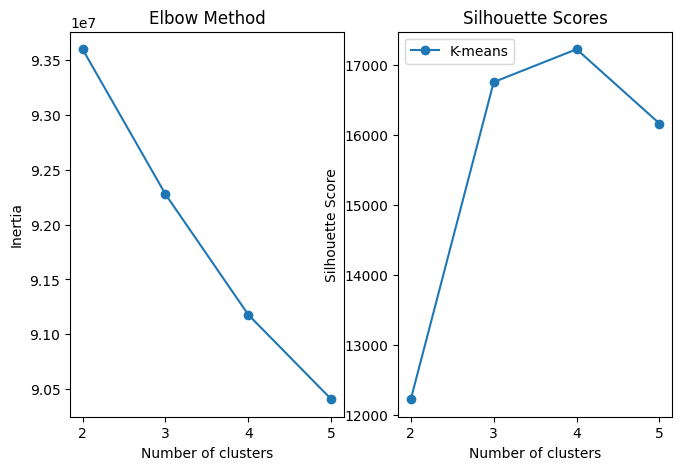

<Figure size 640x480 with 0 Axes>

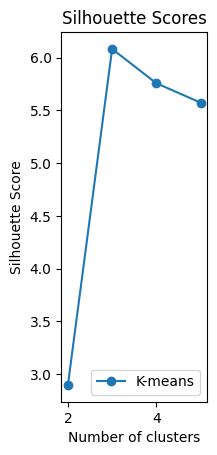

<Figure size 640x480 with 0 Axes>

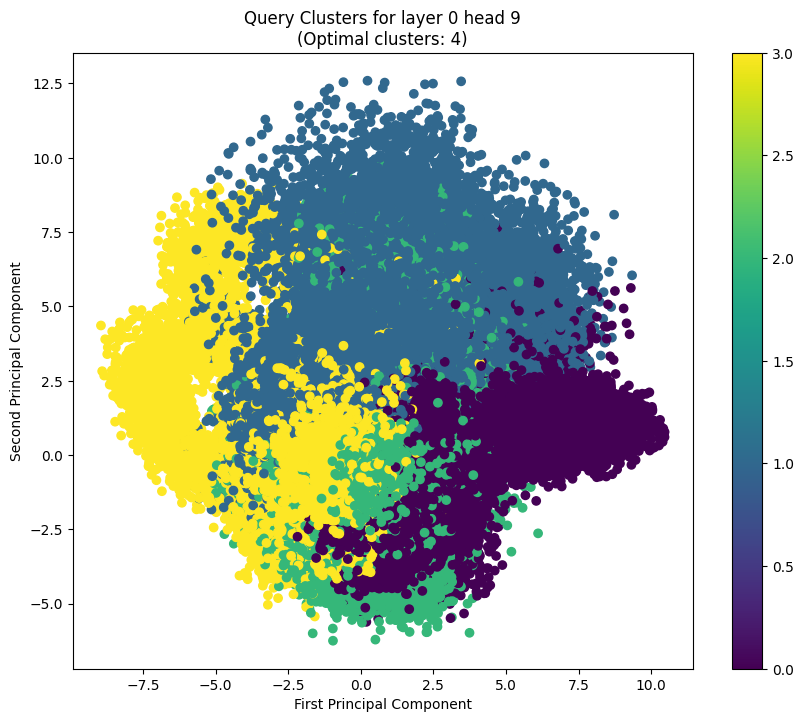

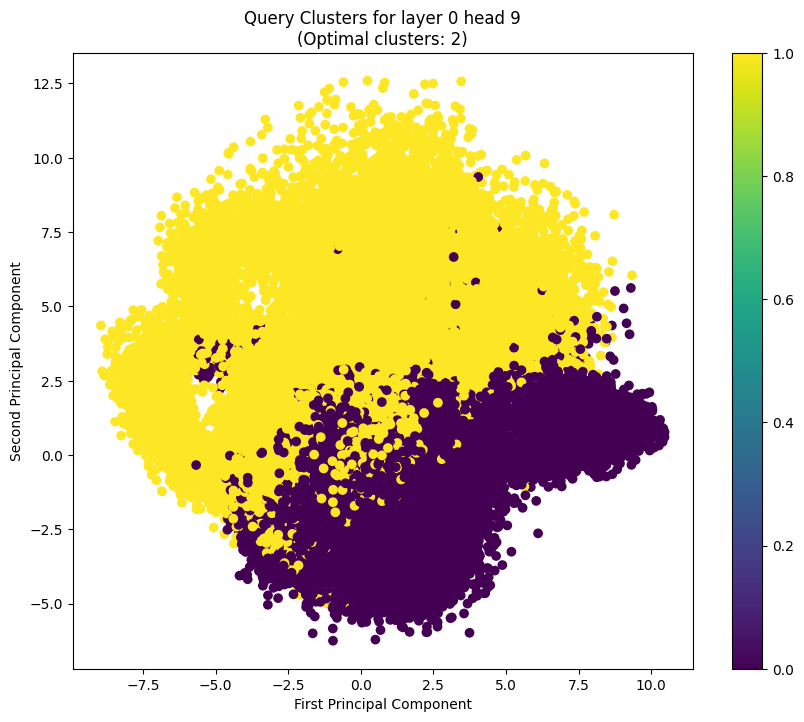

clustering queries for layer 0 head 10 for cluster of size 2
clustering queries for layer 0 head 10 for cluster of size 3
clustering queries for layer 0 head 10 for cluster of size 4
clustering queries for layer 0 head 10 for cluster of size 5
Time taken to compute optimal clusters: 8.51 seconds


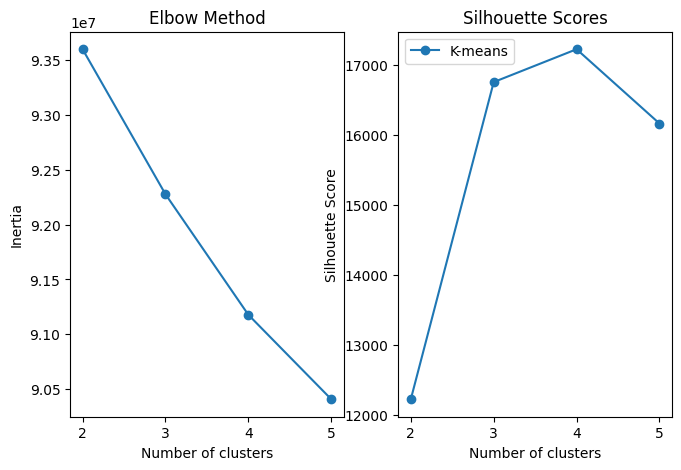

<Figure size 640x480 with 0 Axes>

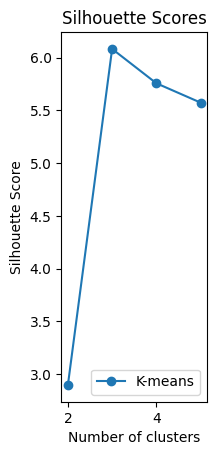

<Figure size 640x480 with 0 Axes>

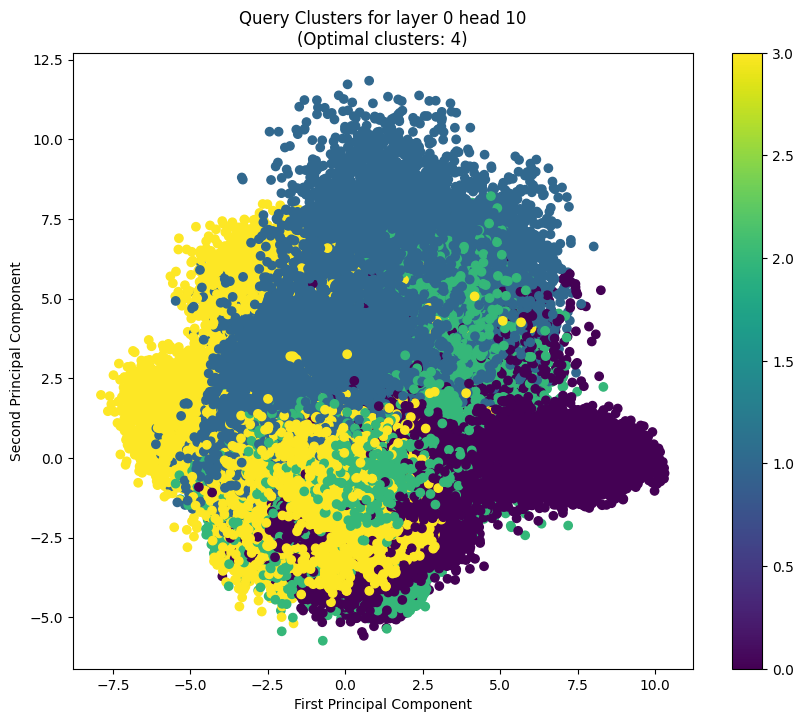

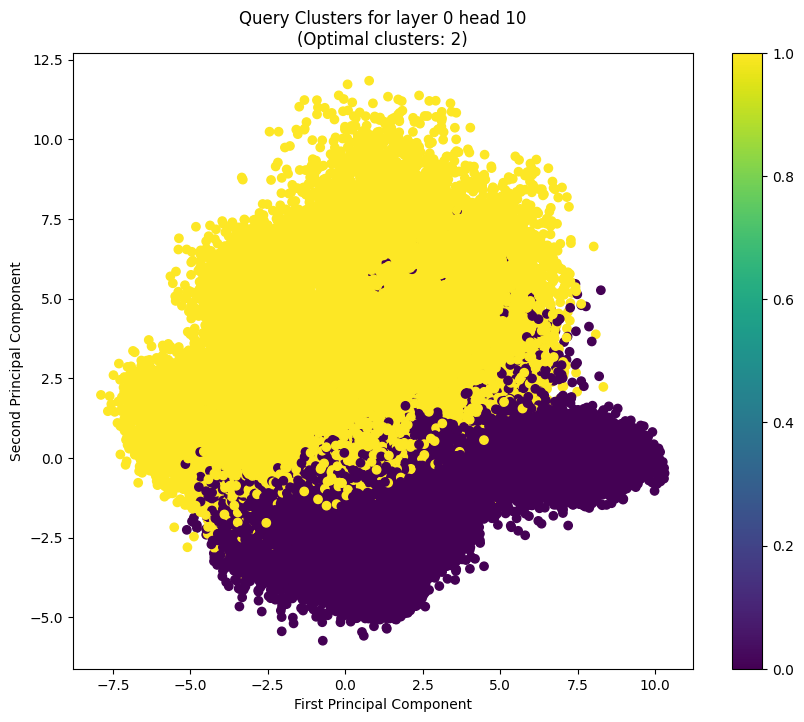

clustering queries for layer 0 head 11 for cluster of size 2
clustering queries for layer 0 head 11 for cluster of size 3
clustering queries for layer 0 head 11 for cluster of size 4
clustering queries for layer 0 head 11 for cluster of size 5
Time taken to compute optimal clusters: 8.49 seconds


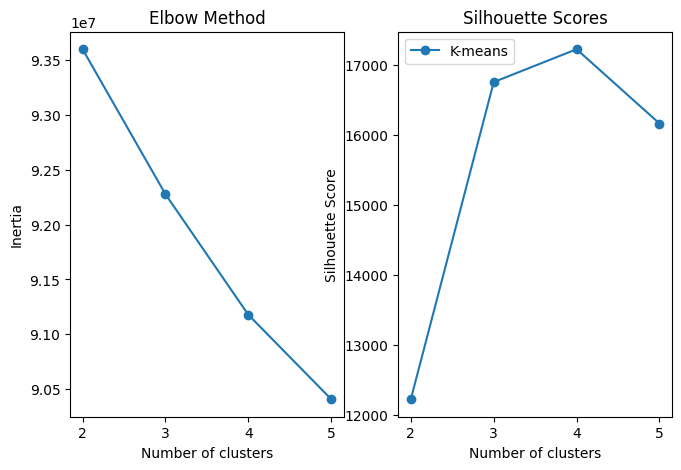

<Figure size 640x480 with 0 Axes>

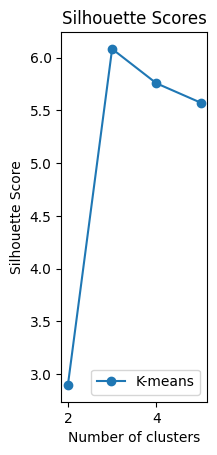

<Figure size 640x480 with 0 Axes>

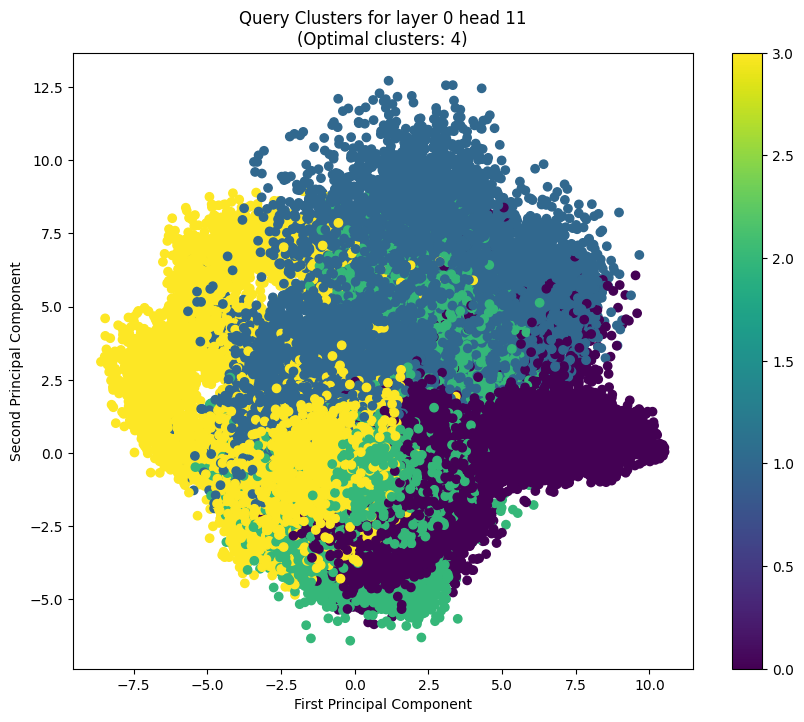

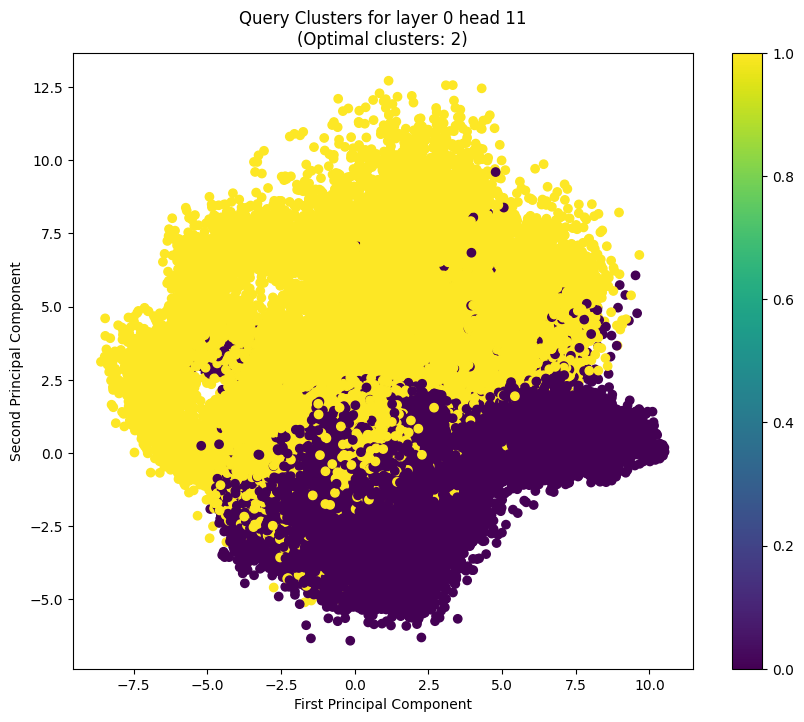

clustering queries for layer 1 head 0 for cluster of size 2
clustering queries for layer 1 head 0 for cluster of size 3
clustering queries for layer 1 head 0 for cluster of size 4
clustering queries for layer 1 head 0 for cluster of size 5
Time taken to compute optimal clusters: 8.55 seconds


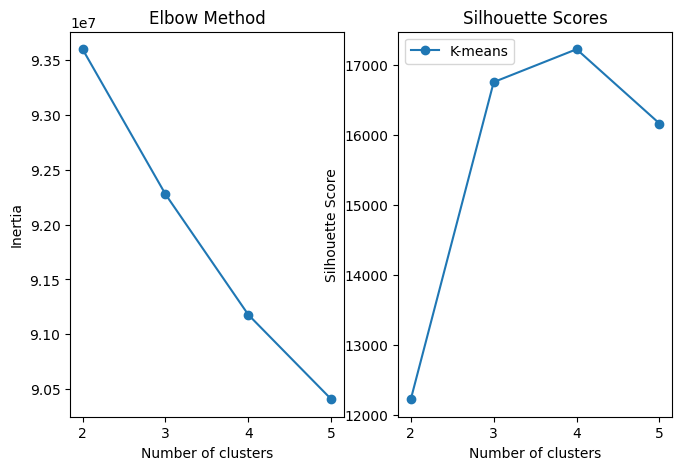

<Figure size 640x480 with 0 Axes>

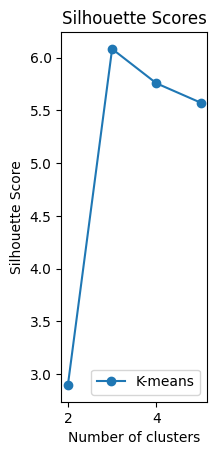

<Figure size 640x480 with 0 Axes>

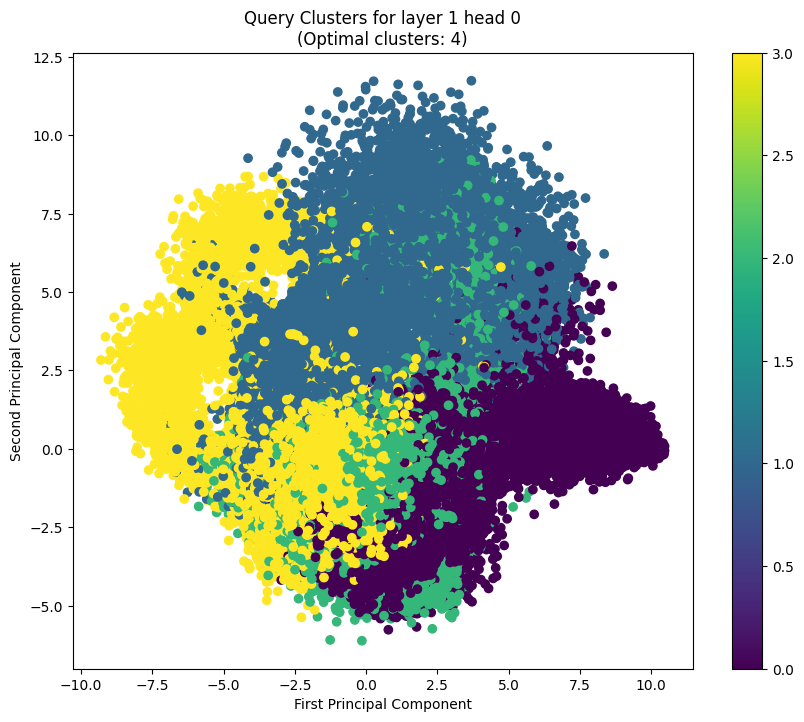

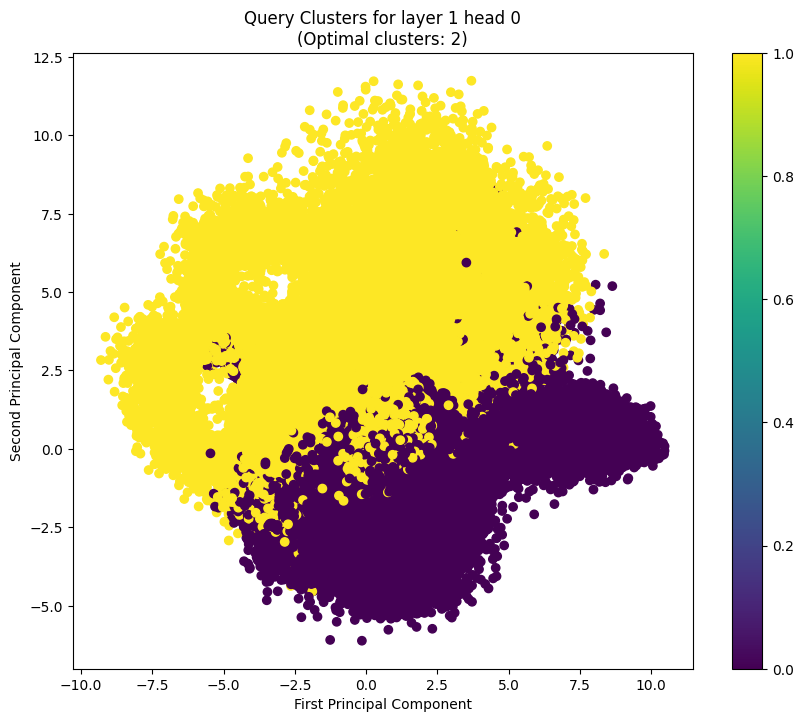

clustering queries for layer 1 head 1 for cluster of size 2
clustering queries for layer 1 head 1 for cluster of size 3
clustering queries for layer 1 head 1 for cluster of size 4
clustering queries for layer 1 head 1 for cluster of size 5
Time taken to compute optimal clusters: 8.63 seconds


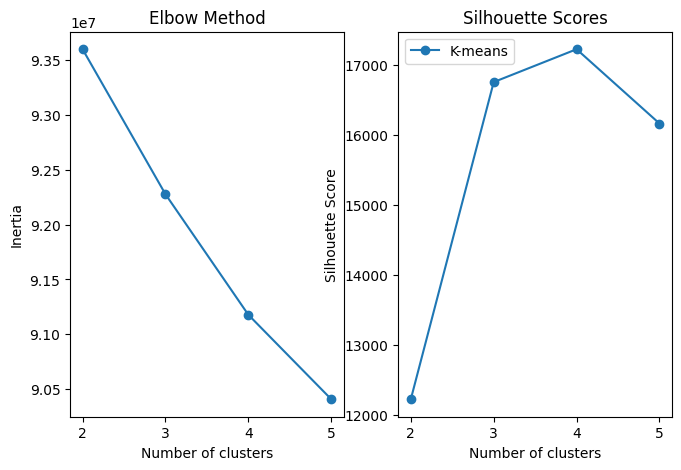

<Figure size 640x480 with 0 Axes>

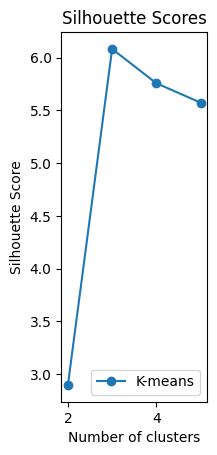

<Figure size 640x480 with 0 Axes>

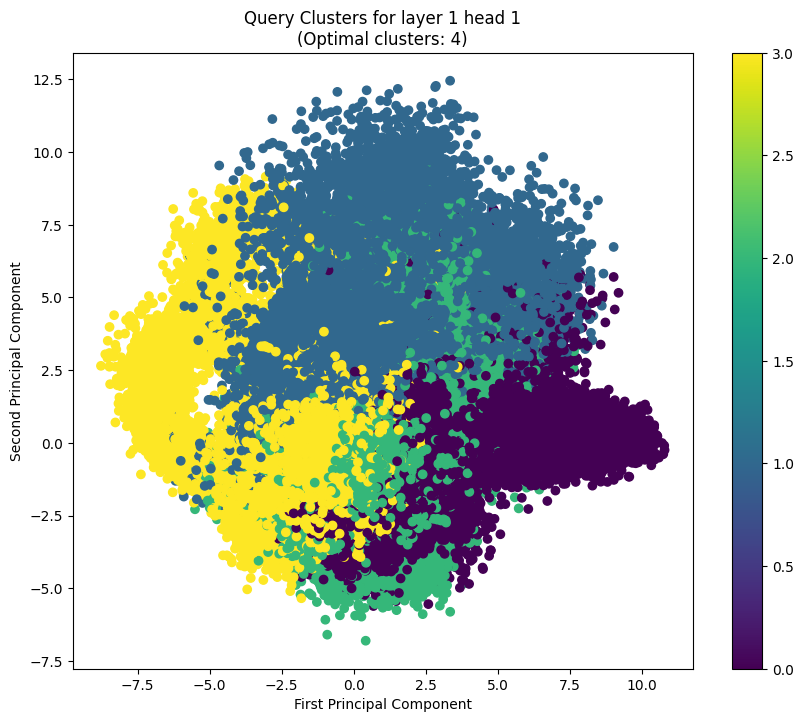

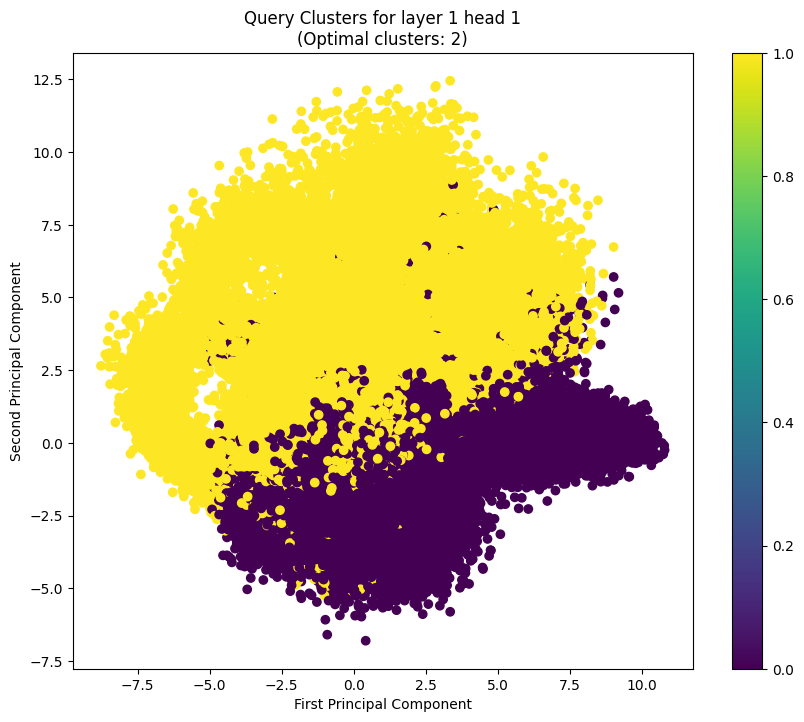

clustering queries for layer 1 head 2 for cluster of size 2
clustering queries for layer 1 head 2 for cluster of size 3
clustering queries for layer 1 head 2 for cluster of size 4
clustering queries for layer 1 head 2 for cluster of size 5
Time taken to compute optimal clusters: 8.55 seconds


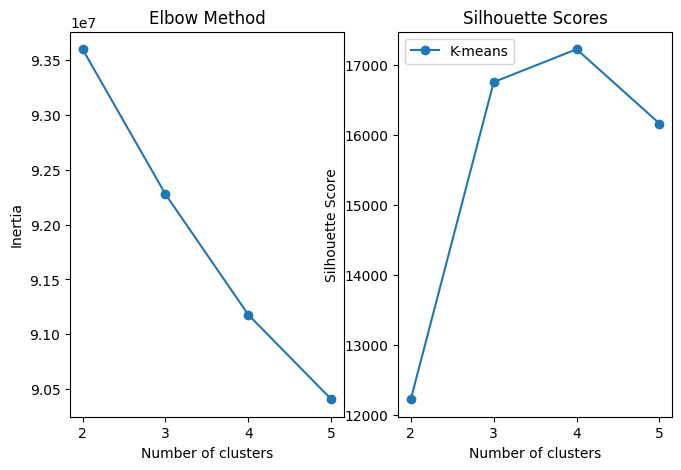

<Figure size 640x480 with 0 Axes>

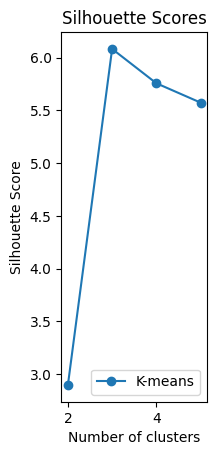

<Figure size 640x480 with 0 Axes>

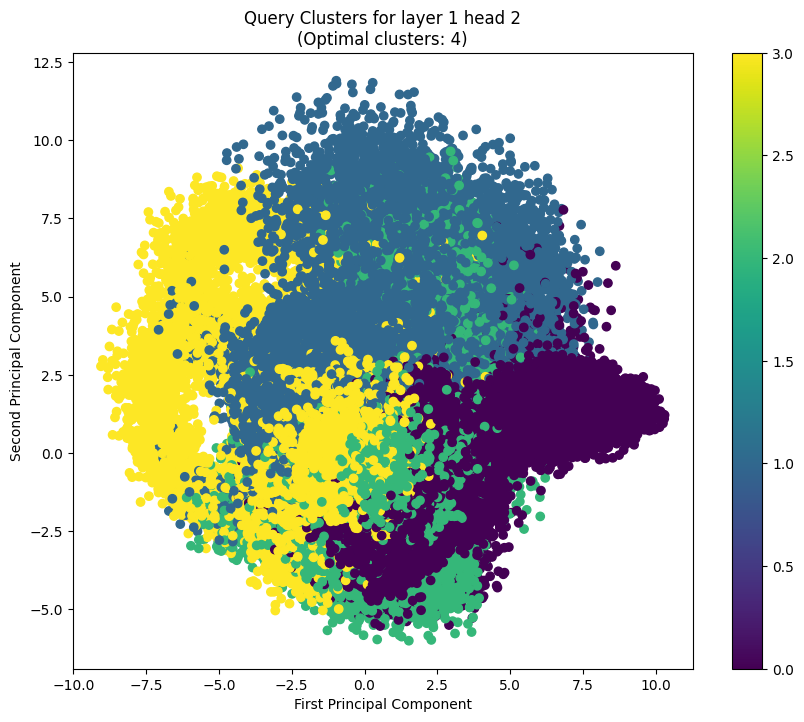

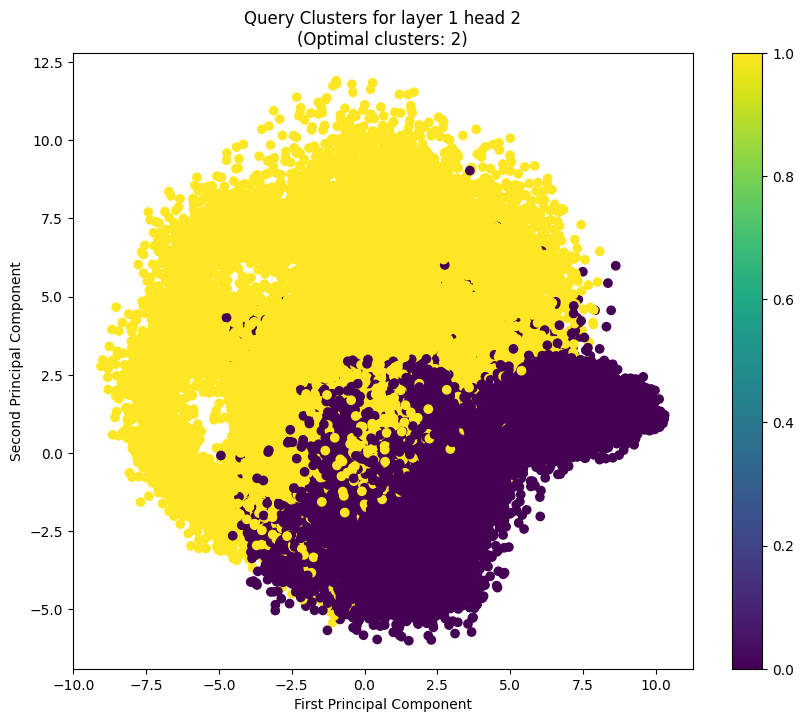

clustering queries for layer 1 head 3 for cluster of size 2
clustering queries for layer 1 head 3 for cluster of size 3
clustering queries for layer 1 head 3 for cluster of size 4
clustering queries for layer 1 head 3 for cluster of size 5
Time taken to compute optimal clusters: 8.62 seconds


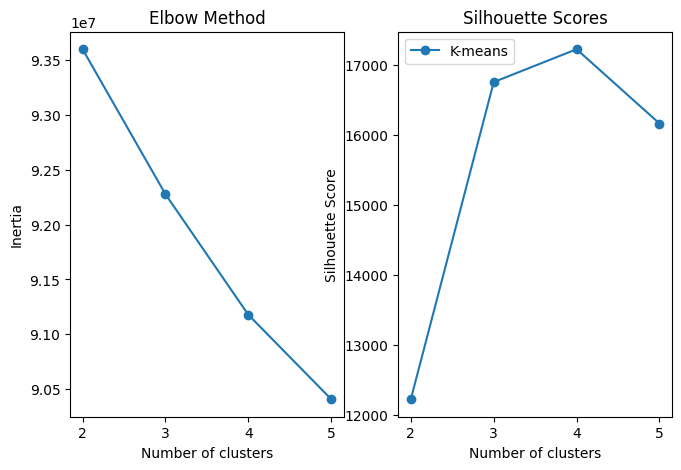

<Figure size 640x480 with 0 Axes>

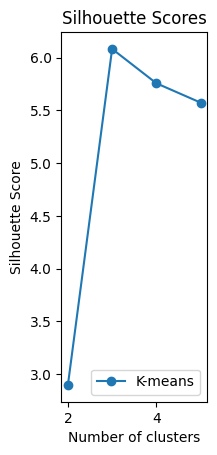

<Figure size 640x480 with 0 Axes>

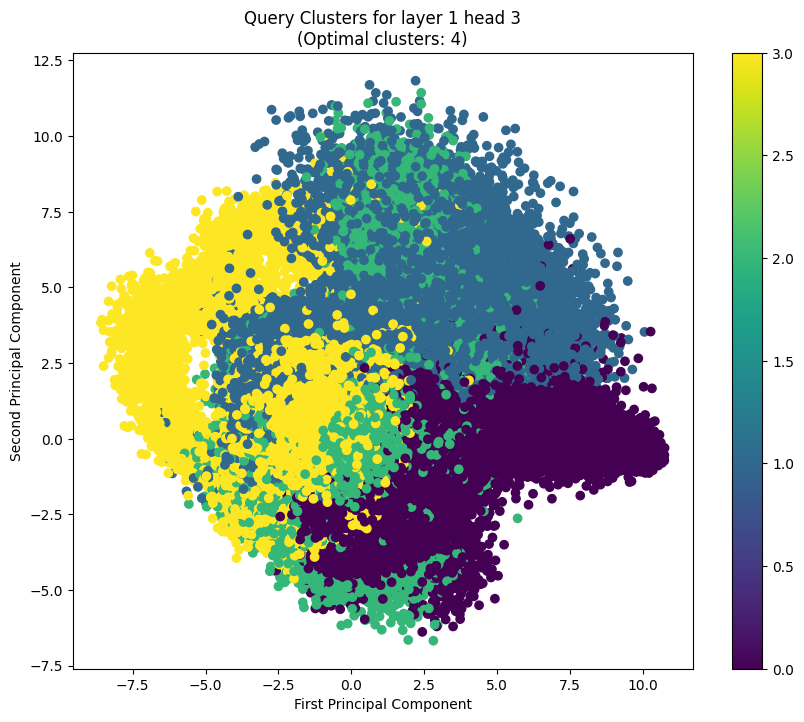

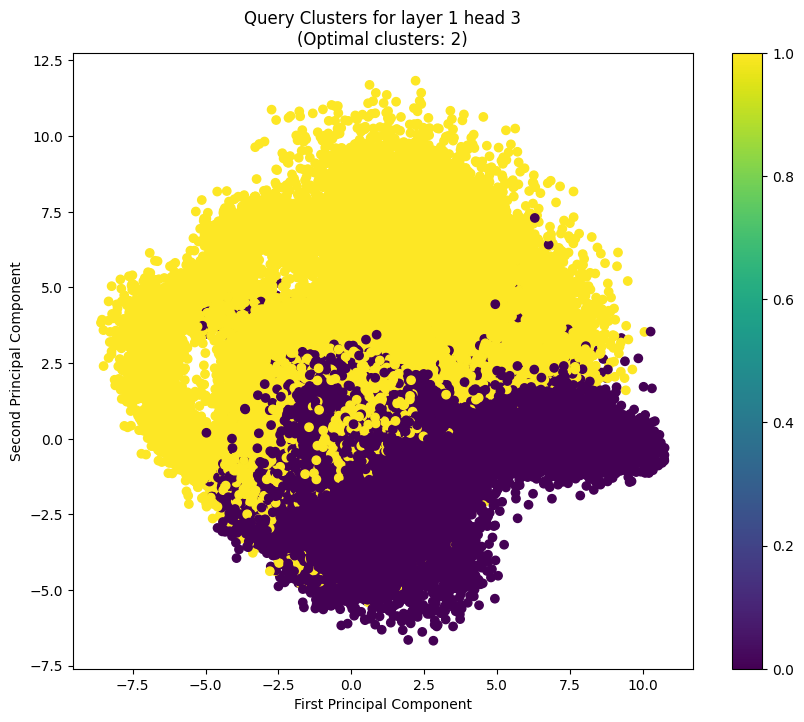

clustering queries for layer 1 head 4 for cluster of size 2
clustering queries for layer 1 head 4 for cluster of size 3
clustering queries for layer 1 head 4 for cluster of size 4
clustering queries for layer 1 head 4 for cluster of size 5
Time taken to compute optimal clusters: 93.71 seconds


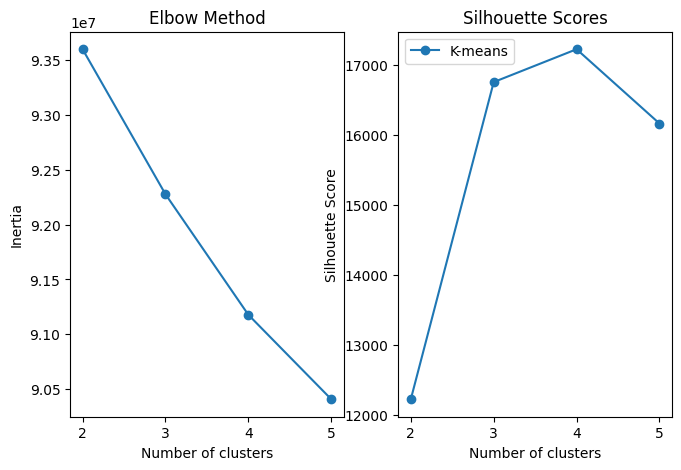

<Figure size 640x480 with 0 Axes>

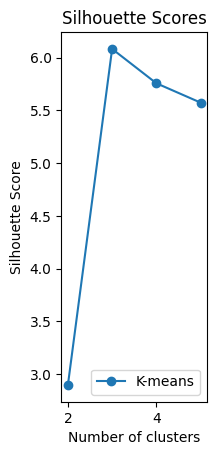

<Figure size 640x480 with 0 Axes>

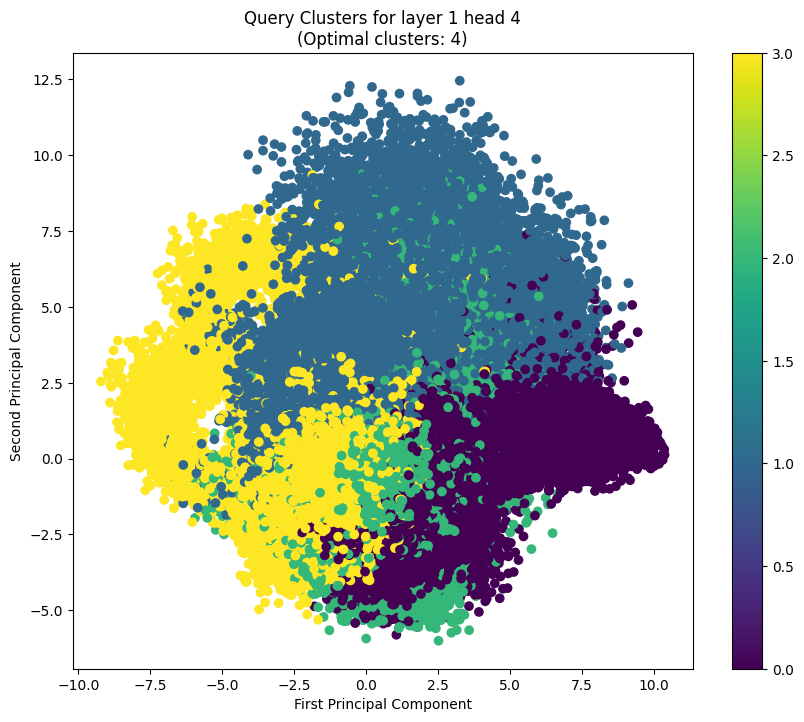

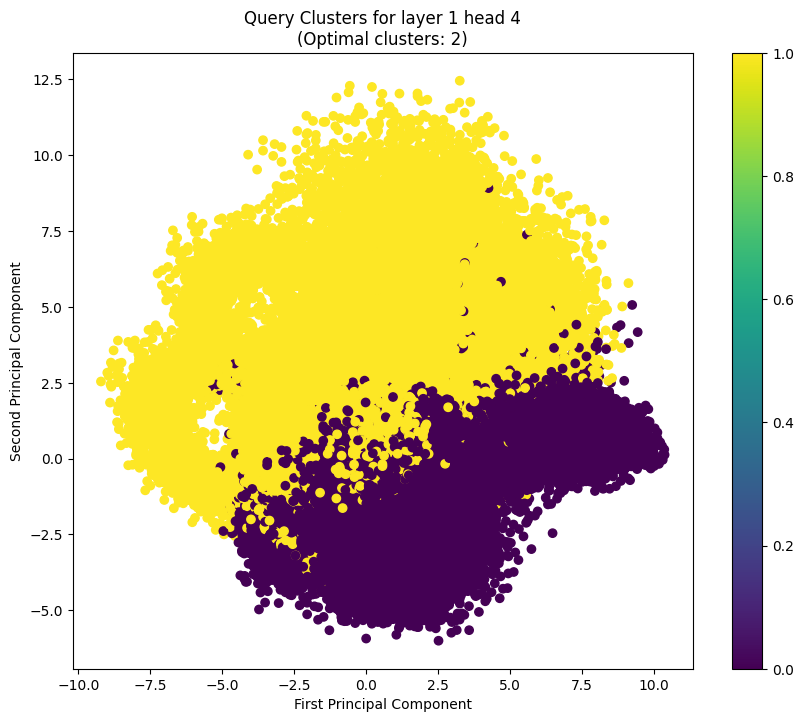

clustering queries for layer 1 head 5 for cluster of size 2
clustering queries for layer 1 head 5 for cluster of size 3
clustering queries for layer 1 head 5 for cluster of size 4
clustering queries for layer 1 head 5 for cluster of size 5
Time taken to compute optimal clusters: 525.72 seconds


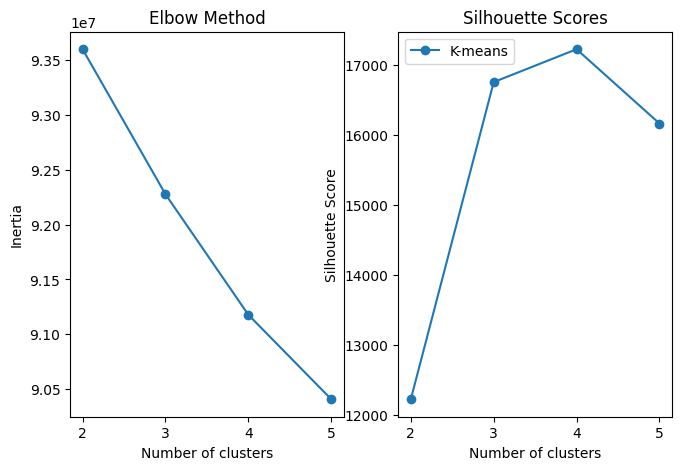

<Figure size 640x480 with 0 Axes>

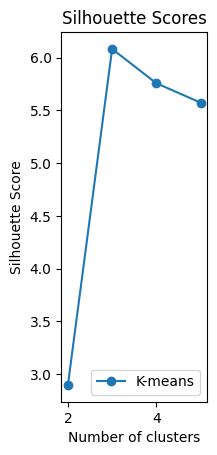

<Figure size 640x480 with 0 Axes>

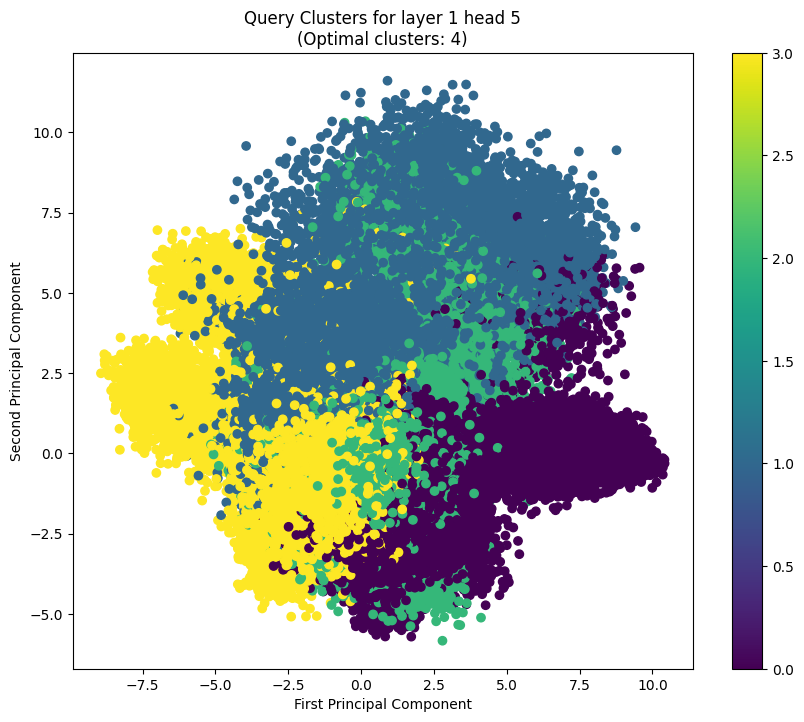

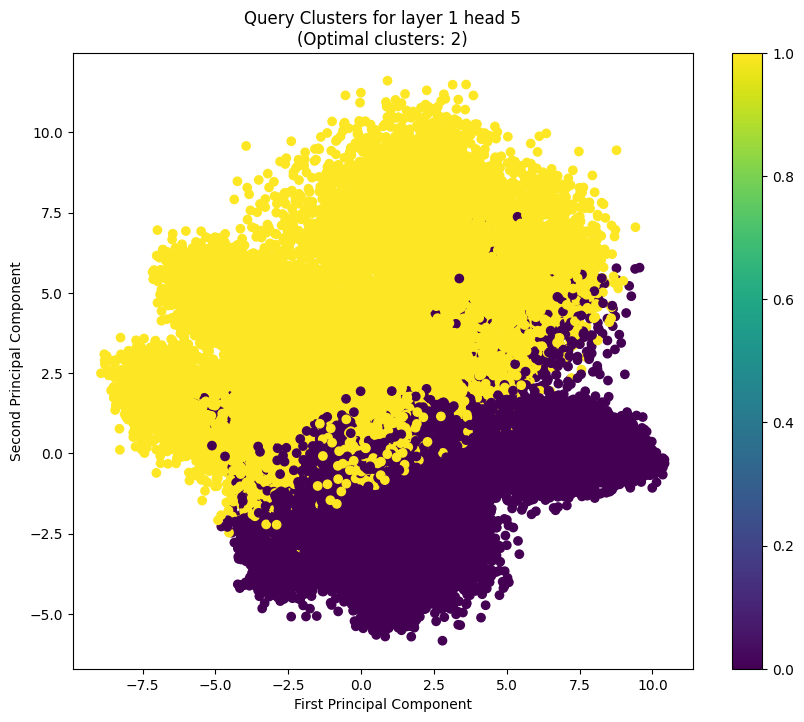

clustering queries for layer 1 head 6 for cluster of size 2
clustering queries for layer 1 head 6 for cluster of size 3
clustering queries for layer 1 head 6 for cluster of size 4
clustering queries for layer 1 head 6 for cluster of size 5
Time taken to compute optimal clusters: 11.09 seconds


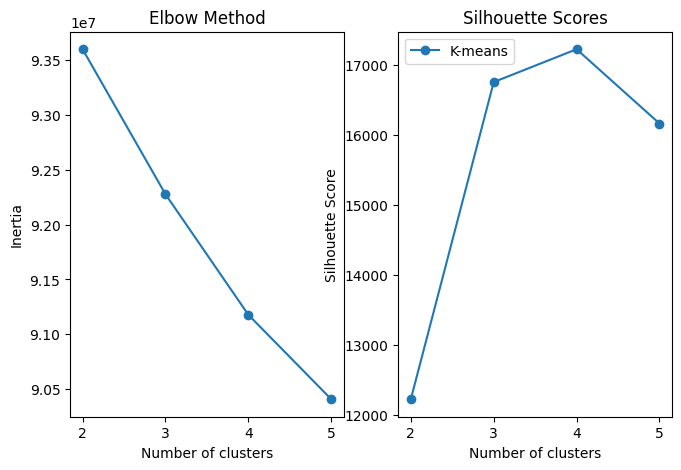

<Figure size 640x480 with 0 Axes>

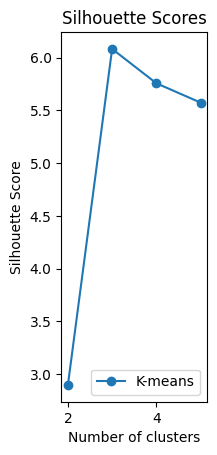

<Figure size 640x480 with 0 Axes>

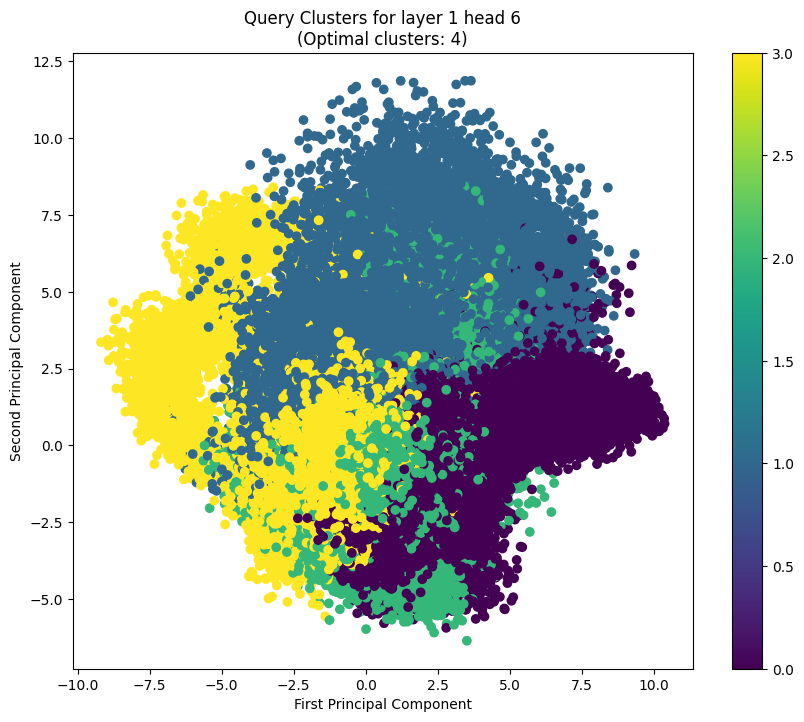

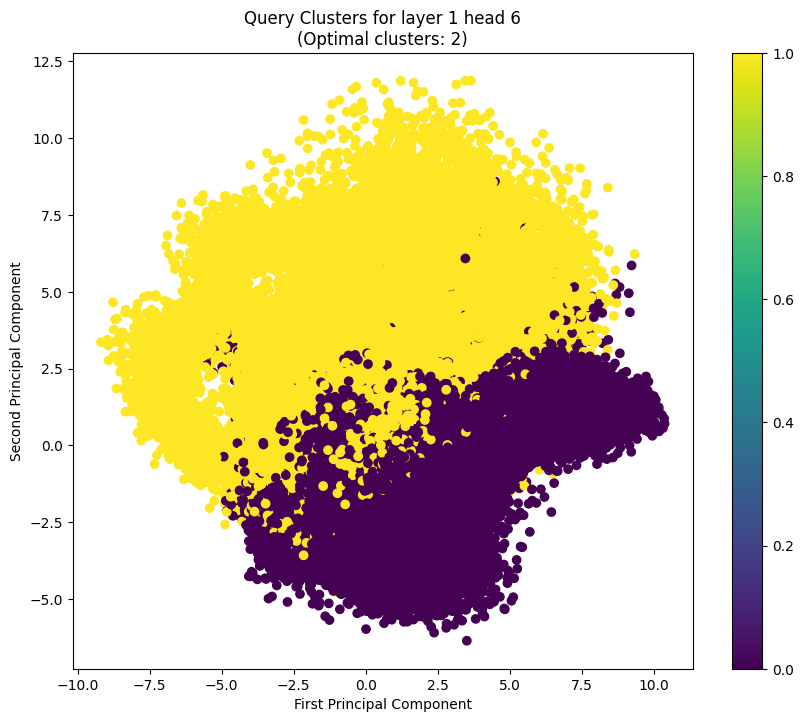

clustering queries for layer 1 head 7 for cluster of size 2
clustering queries for layer 1 head 7 for cluster of size 3
clustering queries for layer 1 head 7 for cluster of size 4
clustering queries for layer 1 head 7 for cluster of size 5
Time taken to compute optimal clusters: 9.49 seconds


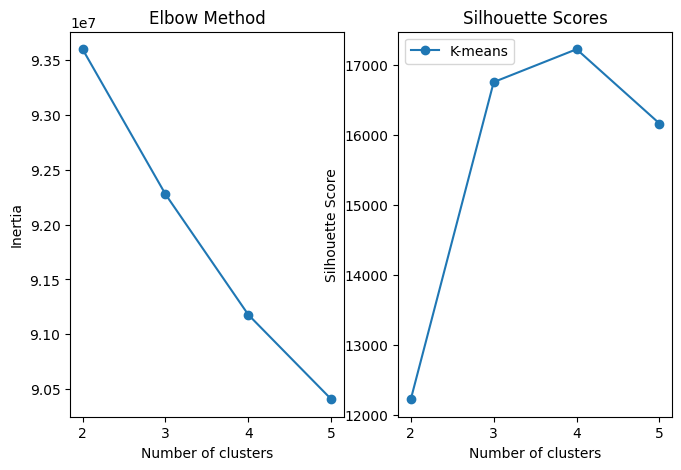

<Figure size 640x480 with 0 Axes>

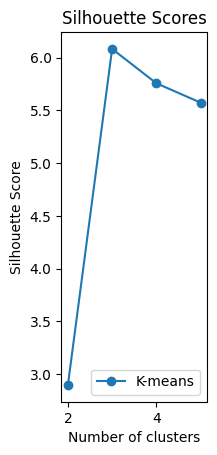

<Figure size 640x480 with 0 Axes>

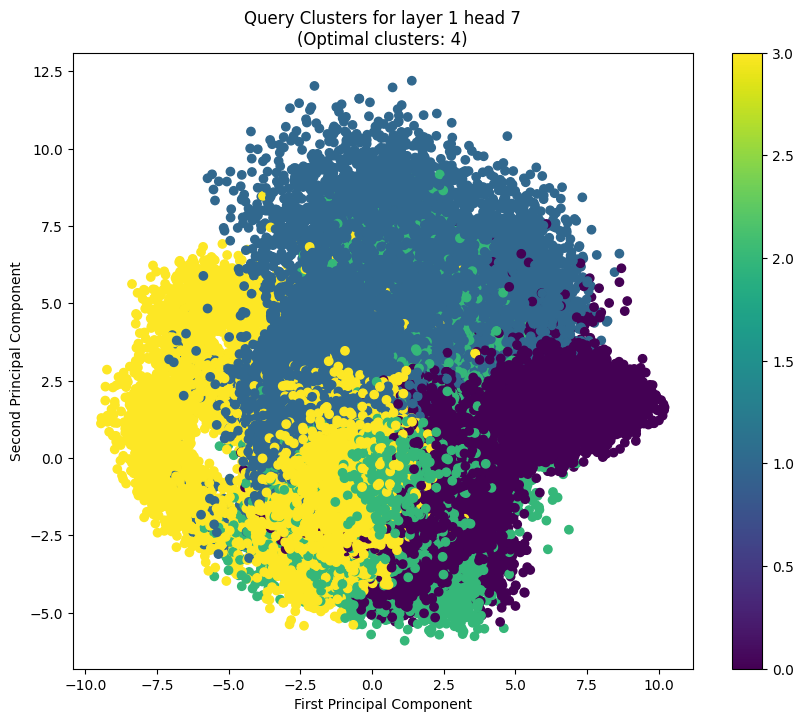

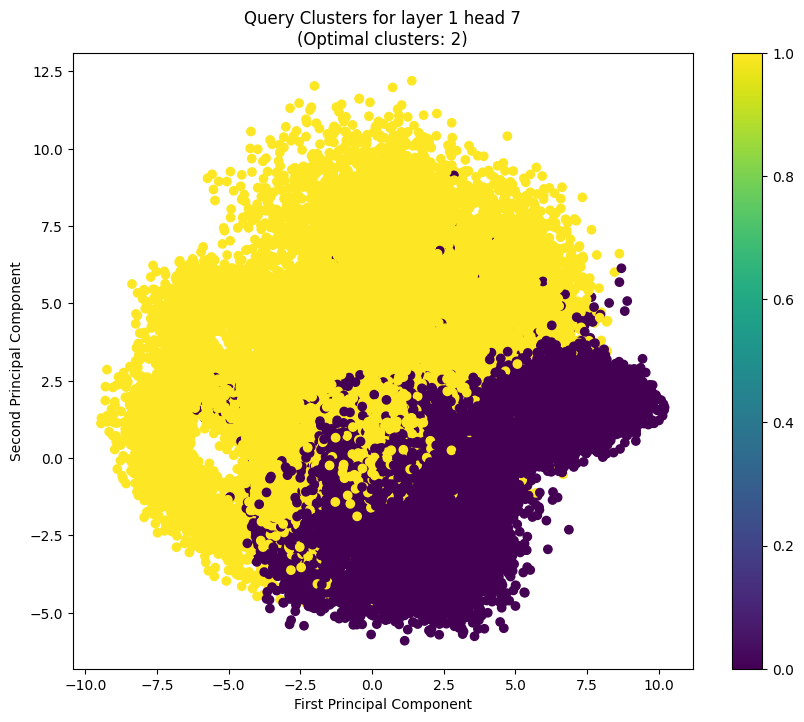

clustering queries for layer 1 head 8 for cluster of size 2
clustering queries for layer 1 head 8 for cluster of size 3
clustering queries for layer 1 head 8 for cluster of size 4
clustering queries for layer 1 head 8 for cluster of size 5
Time taken to compute optimal clusters: 9.51 seconds


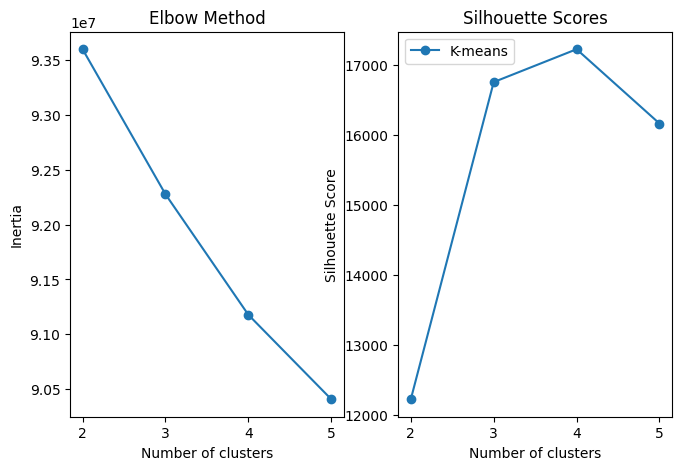

<Figure size 640x480 with 0 Axes>

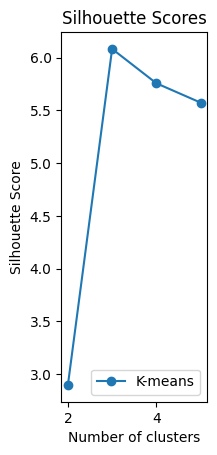

<Figure size 640x480 with 0 Axes>

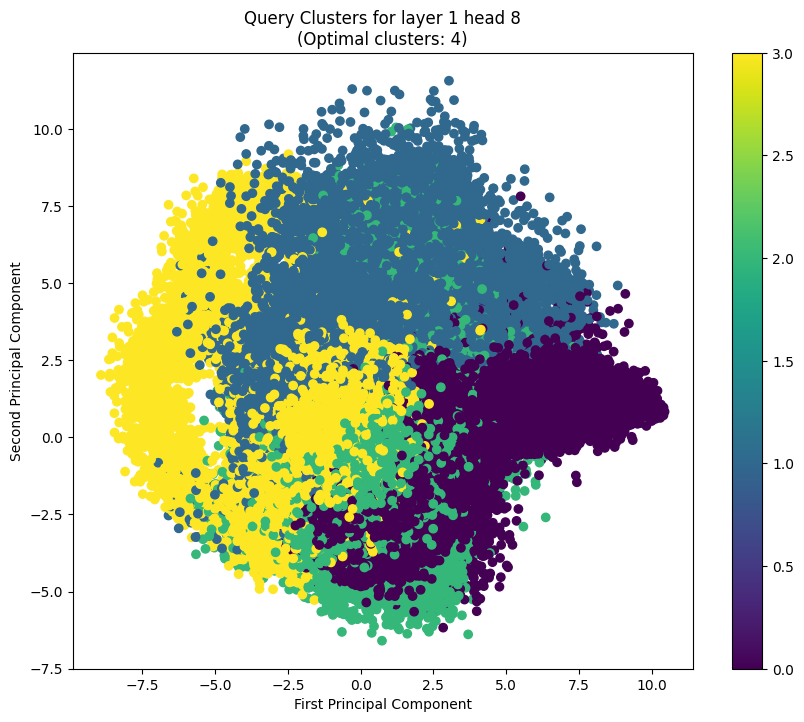

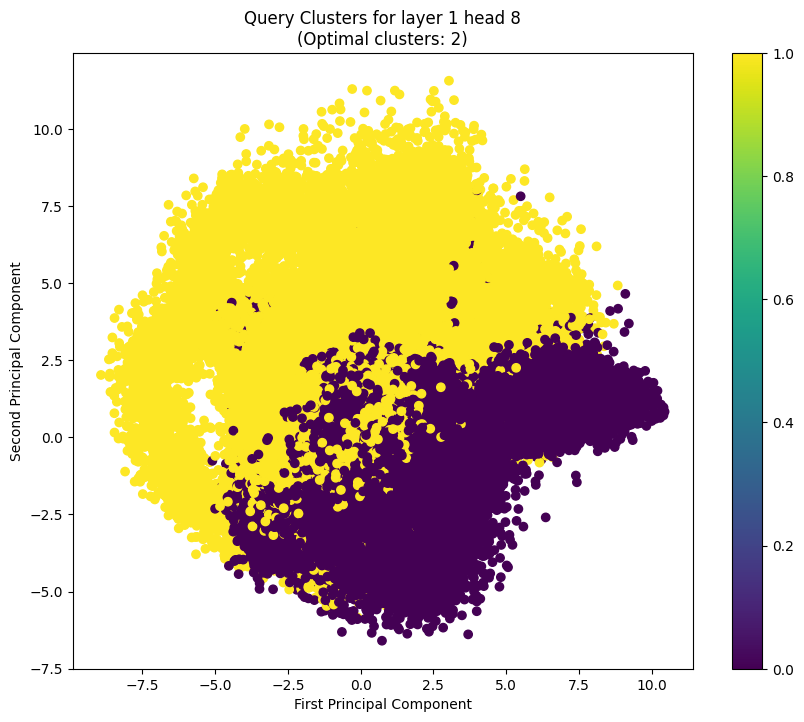

clustering queries for layer 1 head 9 for cluster of size 2
clustering queries for layer 1 head 9 for cluster of size 3
clustering queries for layer 1 head 9 for cluster of size 4
clustering queries for layer 1 head 9 for cluster of size 5
Time taken to compute optimal clusters: 8.74 seconds


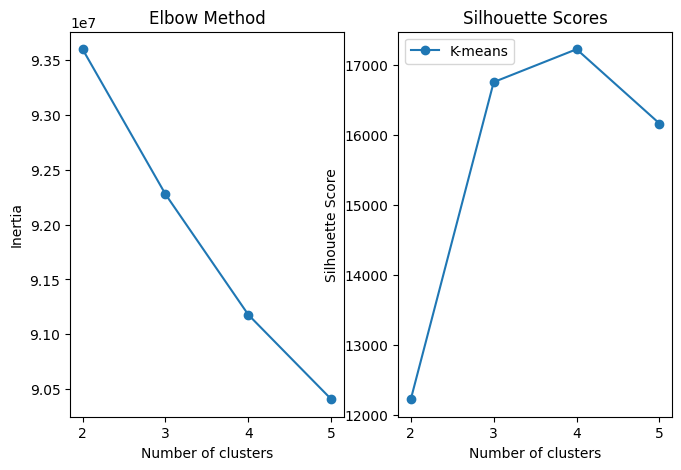

<Figure size 640x480 with 0 Axes>

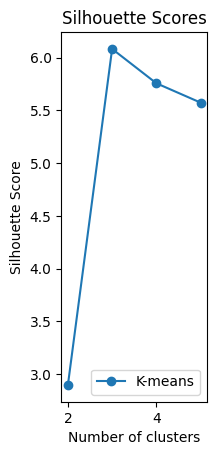

<Figure size 640x480 with 0 Axes>

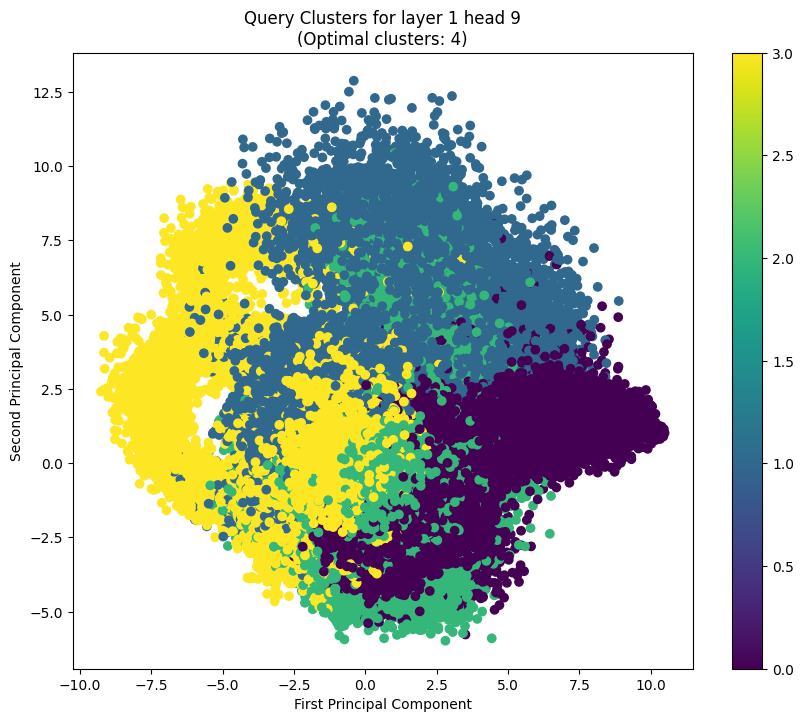

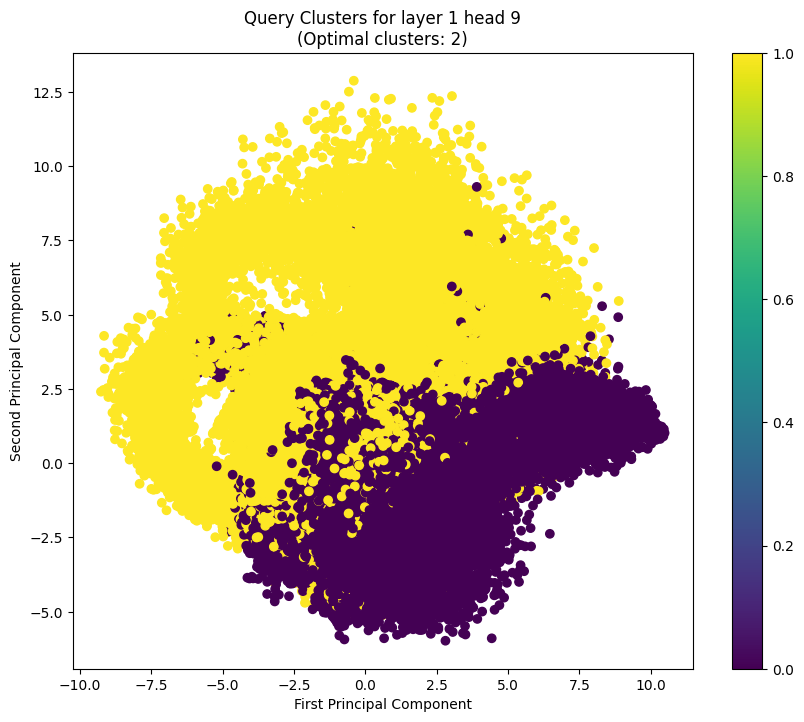

clustering queries for layer 1 head 10 for cluster of size 2
clustering queries for layer 1 head 10 for cluster of size 3
clustering queries for layer 1 head 10 for cluster of size 4
clustering queries for layer 1 head 10 for cluster of size 5
Time taken to compute optimal clusters: 9.99 seconds


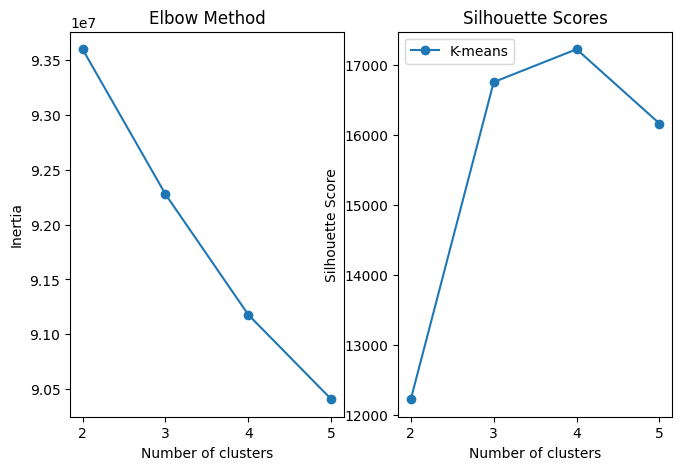

<Figure size 640x480 with 0 Axes>

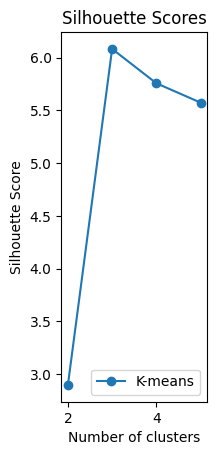

<Figure size 640x480 with 0 Axes>

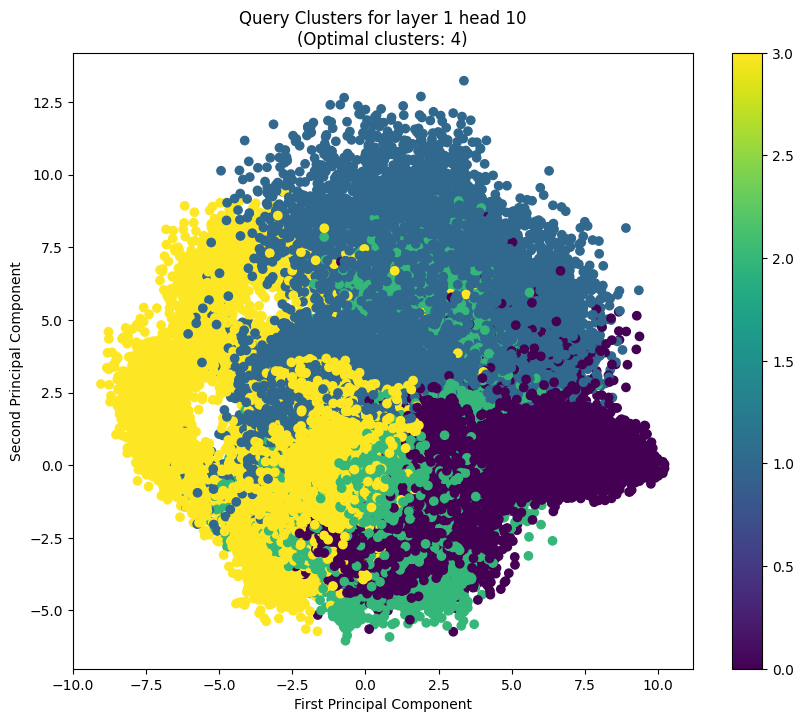

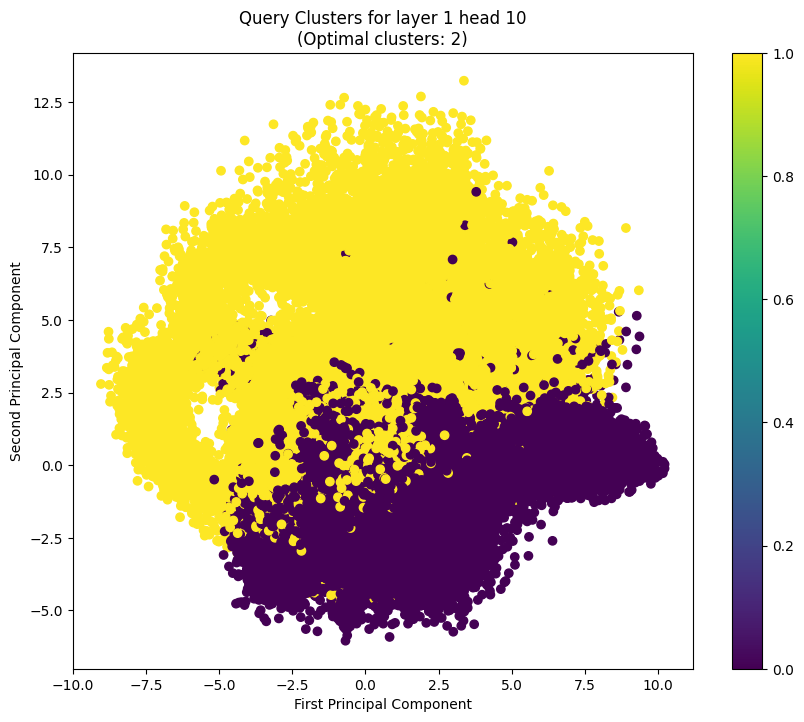

clustering queries for layer 1 head 11 for cluster of size 2
clustering queries for layer 1 head 11 for cluster of size 3
clustering queries for layer 1 head 11 for cluster of size 4
clustering queries for layer 1 head 11 for cluster of size 5
Time taken to compute optimal clusters: 9.32 seconds


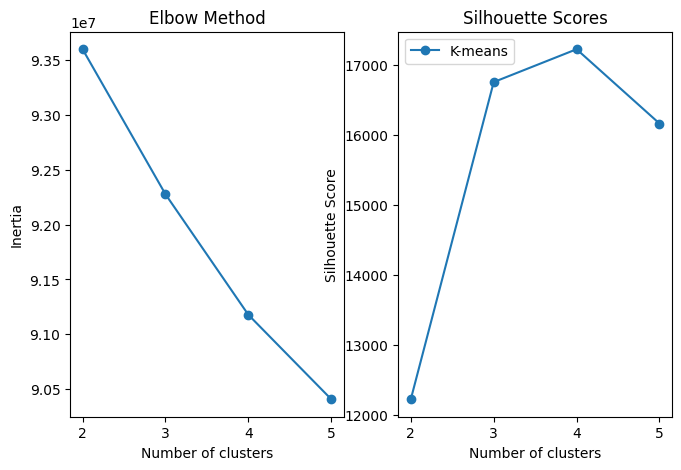

<Figure size 640x480 with 0 Axes>

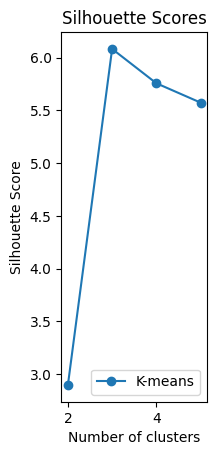

<Figure size 640x480 with 0 Axes>

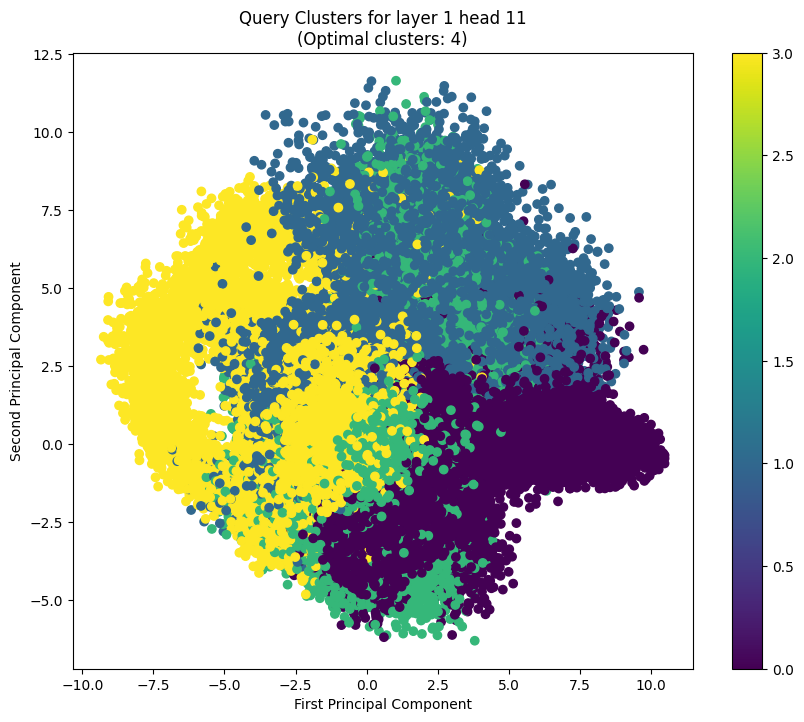

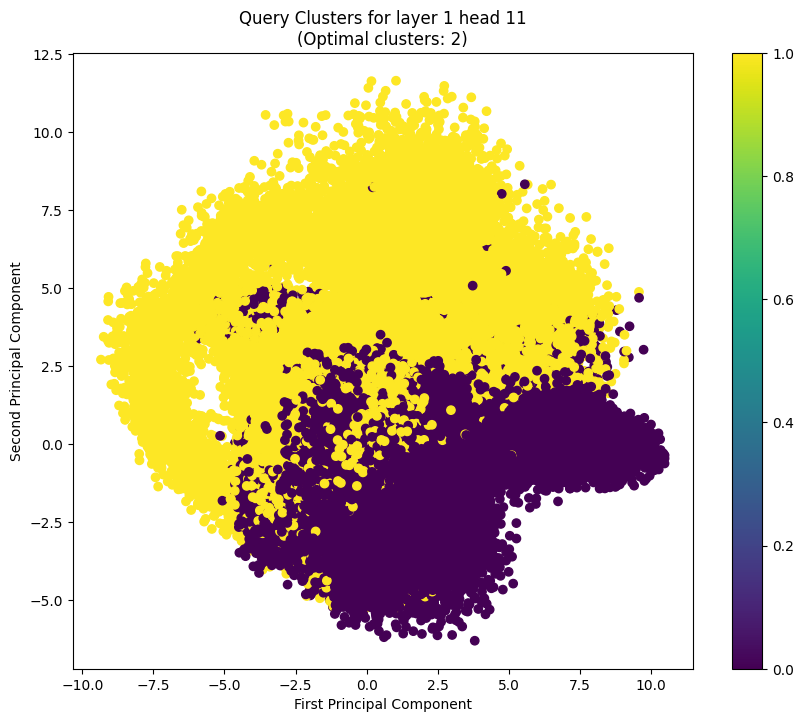

clustering queries for layer 2 head 0 for cluster of size 2
clustering queries for layer 2 head 0 for cluster of size 3
clustering queries for layer 2 head 0 for cluster of size 4
clustering queries for layer 2 head 0 for cluster of size 5
Time taken to compute optimal clusters: 9.63 seconds


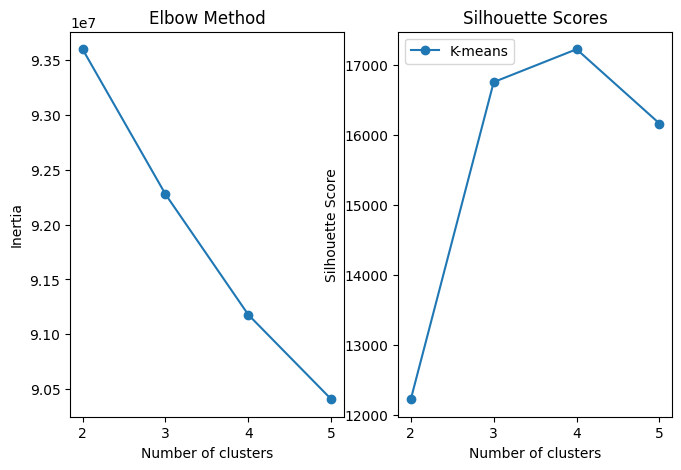

<Figure size 640x480 with 0 Axes>

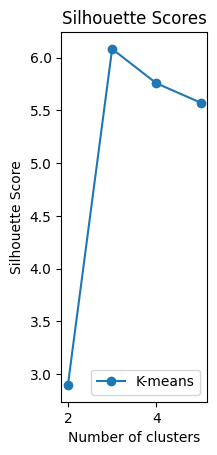

<Figure size 640x480 with 0 Axes>

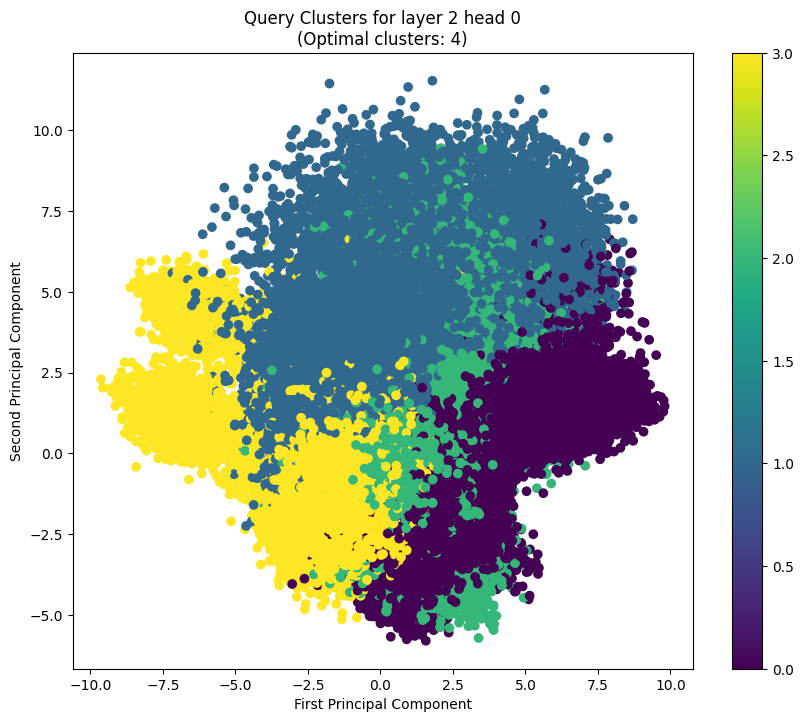

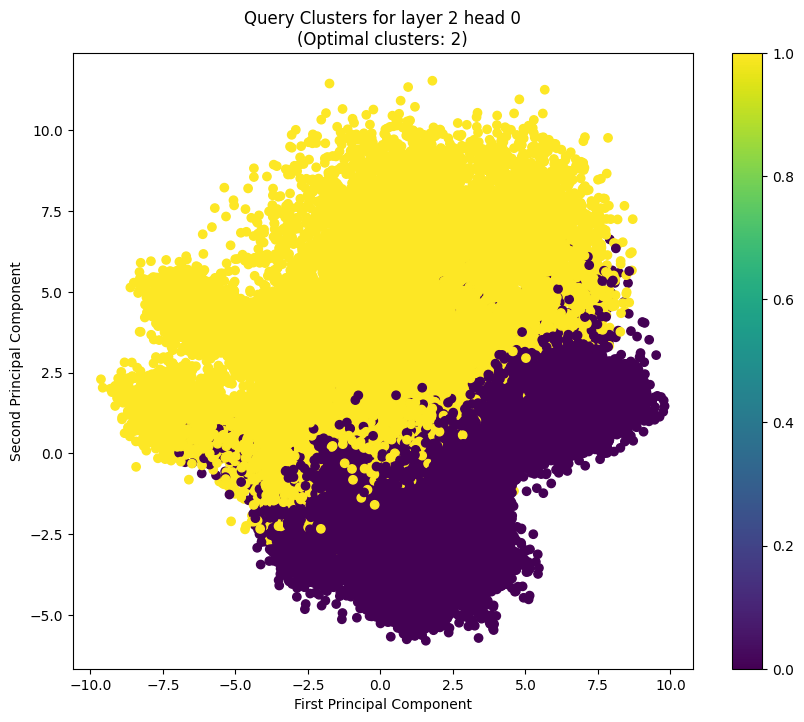

clustering queries for layer 2 head 1 for cluster of size 2
clustering queries for layer 2 head 1 for cluster of size 3
clustering queries for layer 2 head 1 for cluster of size 4
clustering queries for layer 2 head 1 for cluster of size 5
Time taken to compute optimal clusters: 10.13 seconds


In [ ]:
# %%

for i, layer_projs in enumerate(projs_per_layer):
    for j, q_head in enumerate(layer_projs):
        q_proj = np.vstack(q_head)
        # Standardize the data
        scaler = StandardScaler()
        q_head_scaled = scaler.fit_transform(q_proj)

        # Use PCA to reduce to 2D for visualization
        pca = PCA(n_components=2)
        queries_2d = pca.fit_transform(q_head_scaled)

        results, inertias, optimal_k_ch, optimal_k_db = get_optimal_clusters(
            q_head_scaled
        )
        plot_inertia(inertias)
        for score_type, p_num in [("ch_score", 132), ("db_score", 133)]:
            plot_scores(results, score_type=score_type, plot_num=p_num)
        for optimal in [optimal_k_ch, optimal_k_db]:
            plot_optimal(q_head_scaled, queries_2d, optimal)